<a href="https://colab.research.google.com/github/mansour2002/AVA-Net/blob/main/Idea11_dataset3x3_V5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Dataset3x3 for retraining AV-Net (training with total dataset for creating AV-map for Hsieh Dataset

In [ ]:
from segmentation_models.losses import categorical_crossentropy, cce_jaccard_loss
from segmentation_models.metrics import iou_score, f1_score
from segmentation_models.utils import set_trainable
from segmentation_models import Unet
import segmentation_models as sm



import imageio
import imgaug as ia
from imgaug import augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

sm.set_framework('tf.keras')
sm.framework()

from PIL import Image, ImageEnhance
#
from tensorflow.python.client import device_lib
import tensorflow as tf
#
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Input, Conv2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from tensorflow.keras import metrics
from tensorflow.keras import backend as K
import tensorflow.keras
#
from time import time
#
import sklearn
from sklearn.model_selection import train_test_split
from skimage import img_as_float, transform, exposure, io, color
import matplotlib.pyplot as plt
from matplotlib import image
from pathlib import Path
import pandas as pd
import numpy as np
import cv2
import os

In [ ]:
# C:\Users\Lieri\AppData\Local\Programs\Python\Python39\Lib\site-packages\keras_preprocessing\image       image_data_generator.py
#  C:\Users\Lieri\AppData\Local\Programs\Python\Python39\Lib\site-packages\keras\preprocessing\      image.py

In [ ]:


# image_dir = Path('Dataset/train/Input/')
# mask_dir = Path('Dataset/train/AV_map/')
parent_dir = 'D:\\AV Project\\AV-Net'
try:
    os.mkdir(os.path.join(parent_dir, 'tmp_Idea11'))
    os.mkdir(os.path.join(parent_dir, 'tmp_Idea11\\Dataset'))
    os.mkdir(os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train'))
    os.mkdir(os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train\\Input'))
    os.mkdir(os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train\\AV_map'))
    os.mkdir(os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train\\Vessel_map'))
except OSError:
    pass

In [ ]:
def classification_map(image):
    labels=np.zeros(image.shape)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (image[i,j,0]>127.5 and image[i,j,1]<127.5 and image[i,j,1]<127.5):
                labels[i,j,:]=[255,0,0]    # Red
            elif (image[i,j,0]<127.5 and image[i,j,1]>127.5 and image[i,j,1]>127.5):
                labels[i,j,:]=[0,0,255]    # Blue
            else:
                labels[i,j,:]=[0,255,0]    # Green

    return labels

In [ ]:
def VesselsMask(image):
    labels=np.zeros((image.shape[0],image.shape[1],1))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (image[i,j,0]>0.5 and image[i,j,1]<0.5 and image[i,j,2]<0.5):
                labels[i,j,:]=1    # Red
            elif (image[i,j,0]<0.5 and image[i,j,1]<0.5 and image[i,j,2]>0.5):
                labels[i,j,:]=1    # Blue
            else:
                labels[i,j,:]=0    # Green

    return labels

In [ ]:
def VesselsMaskfromDataset(image):
    labels=np.zeros((image.shape[0],image.shape[1],1))
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (image[i,j,0]>127.5 and image[i,j,1]<127.5 and image[i,j,2]<127.5):
                labels[i,j,:]= 255    # Red
            elif (image[i,j,0]<127.5 and image[i,j,1]>127.5 and image[i,j,2]>127.5):
                labels[i,j,:] = 255    # Blue
            else:
                labels[i,j,:]=0    # Green

    return labels

In [ ]:
# # transfering images to folders and converting them to desired dimensions
# import random
from shutil import copyfile
# from pathlib import Path
imagesize=np.int(320)
# # imagedepth=np.int(640)
# # subimagedepth=np.int(40)
div=np.int(1)
subimagesize=np.int(imagesize/div)



def split_data(SOURCE, DESTINATION):
    i=np.int(0)
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    files = []
    for subfolder in os.listdir(SOURCE):
        for filename in os.listdir(SOURCE+subfolder+'\\'+SUBCLASS[1]):
            # print(i)
            # i+= 1
            if filename[-1]=='f':
                file_OCT = SOURCE + subfolder + '\\'+SUBCLASS[1]+'\\' + filename[:-5]+'.tiff'
                file_OCTA = SOURCE + subfolder + '\\'+SUBCLASS[2]+'\\' + filename[:-5]+'.tiff'
                file_AV_map = SOURCE + subfolder + '\\'+SUBCLASS[3]+'\\' + filename[:-5]+'.tiff'
                destination_Input = DESTINATION + 'train\\Input'+'\\' + filename[:-5]+'.png'
                destination_Output = DESTINATION + 'train\\AV_map'+'\\' + filename[:-5]+'.png'
                destination_Output1 = DESTINATION + 'train\\Vessel_map'+'\\' + filename[:-5]+'.png'
            if filename[-1]=='g':
                # print(i)
                # i+= 1
                file_OCT = SOURCE + subfolder + '\\'+SUBCLASS[1]+'\\' + filename[:-4]+'.png'
                file_OCTA = SOURCE + subfolder + '\\'+SUBCLASS[2]+'\\' + filename[:-4]+'.png'
                file_AV_map = SOURCE + subfolder + '\\'+SUBCLASS[3]+'\\' + filename[:-4]+'.tiff'
                destination_Input = DESTINATION + 'train\\Input'+'\\' + filename[:-4]+'.png'
                destination_Output = DESTINATION + 'train\\AV_map'+'\\' + filename[:-4]+'.png'
                destination_Output1 = DESTINATION + 'train\\Vessel_map'+'\\' + filename[:-4]+'.png'

                # print(file_AV_map)


            im_OCT = Image.open(file_OCT)
            im_OCTA = Image.open(file_OCTA)
            im_AV_map = Image.open(file_AV_map)
            im_OCT = im_OCT.convert('L')
            im_OCTA = im_OCTA.convert('L')

            im_OCT = im_OCT.resize((imagesize, imagesize))
            im_OCTA = im_OCTA.resize((imagesize, imagesize))
            im_AV_map = im_AV_map.resize((imagesize, imagesize))
            im_zero = np.zeros((imagesize, imagesize))

            im_OCT = np.array(im_OCT, dtype=np.float32)
            im_OCTA = np.array(im_OCTA, dtype=np.float32)
            im_AV_map = np.array(im_AV_map, dtype=np.float32)
            im_Vessels_Map = VesselsMaskfromDataset(im_AV_map)
            # print(im_OCTA.shape)
            
            im_OCT = 255.0*(im_OCT-np.min(im_OCT))/(np.max(im_OCT)-np.min(im_OCT))
            im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))

            im_OCT = np.expand_dims(im_OCT, axis=2)
            im_OCTA = np.expand_dims(im_OCTA, axis=2)
            im_zero = np.expand_dims(im_zero, axis=2)
            im_OCT_OCTA = np.concatenate((im_OCT, im_OCTA, im_zero), axis=-1)
            # print(im_AV_map.shape)
            # print(im_AV_map[0:2,0:100,:])
            im_AV_OneHot=classification_map(im_AV_map[:,:,0:3])

            # destination_Input = DESTINATION + 'train\\Input'+'\\' + filename[:-5]+'.png'
            # destination_Output = DESTINATION + 'train\\AV_map'+'\\' + filename[:-5]+'.png'

            Image.fromarray(np.squeeze(im_OCT_OCTA.astype(np.uint8))).save(destination_Input)
            Image.fromarray(im_AV_OneHot.reshape(imagesize, imagesize,3).astype(np.uint8)).save(destination_Output)

            Image.fromarray(im_Vessels_Map.reshape(imagesize, imagesize).astype(np.uint8)).save(destination_Output1)

            p = Path(destination_Input)
            head, tail = os.path.split(p)
            files.append(tail)





    # print(files)
    files=list(set(files))
    # training_length = int(len(files) * SPLIT_SIZE)
    # testing_length = int(len(files) - training_length)
    # print(len(files),training_length,testing_length )
    # shuffled_set = random.sample(files, len(files))
    # training_set = shuffled_set[0:training_length]
    # testing_set = shuffled_set[training_length:]



    # for filename in training_set:
    #     this_file = DESTINATION + 'Input'+ '\\' + filename[:-4]+'.png'
    #     destination = TRAINING + 'Input'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)


    # for filename in testing_set:
    #     this_file = DESTINATION + 'Input'+ '\\' + filename[:-4]+'.png'
    #     destination = TESTING + 'Input'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)


    # for filename in training_set:
    #     this_file = DESTINATION + 'Output'+ '\\' + filename[:-4]+'.png'
    #     destination = TRAINING + 'Output'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)


    # for filename in testing_set:
    #     this_file = DESTINATION + 'Output'+ '\\' + filename[:-4]+'.png'
    #     destination = TESTING + 'Output'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)

    return files



SOURCE_DIR = "D:\\AV Project\\Dataset3x3mm\\"
DESTINATION_DIR = "D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\"


# filenames = split_data(SOURCE_DIR, DESTINATION_DIR)

In [ ]:

# @tf.function()
def iou_coef_MC(y_true, y_pred):
    smooth = 1
    threshold = 0.5
    y_true = tf.where(tf.cast(y_true, tf.float32)>=threshold,1.0,0.0)
    y_pred = tf.where(tf.cast(y_pred, tf.float32)>=threshold,1.0,0.0)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2])
    union = K.sum(y_true,[1,2])+K.sum(y_pred,[1,2])-intersection
    # iou = K.mean(tf.math.divide_no_nan((intersection),(union)))
    iou = K.mean((intersection + smooth) / (union + smooth))
    return iou
# @tf.function()

def iou_coef_MC_for_loss(y_true, y_pred):
    smooth = 1
    threshold = 0.5
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2])
    union = K.sum(y_true,[1,2])+K.sum(y_pred,[1,2])-intersection
    # iou = K.mean(tf.math.divide_no_nan((intersection),(union)))
    iou = K.mean((intersection + smooth) / (union + smooth))
    return iou

    
# @tf.function()
def iou_coef_perclass(y_true, y_pred):
    smooth = 1
    threshold = 0.5
    y_true = tf.where(tf.cast(y_true, tf.float32)>=threshold,1.0,0.0)
    y_pred = tf.where(tf.cast(y_pred, tf.float32)>=threshold,1.0,0.0)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2])
    union = K.sum(y_true,[1,2])+K.sum(y_pred,[1,2])-intersection
    # iou = K.mean(tf.math.divide_no_nan((intersection),(union)))
    iou = K.mean((intersection + smooth) / (union + smooth), axis=[0])
    return iou


# @tf.function()
def iou_loss_MC(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    return 1-iou_coef_MC_for_loss(y_true, y_pred)

# @tf.function()
def w_iou_coef(y_true, y_pred, smooth=1):
    y_true = tf.where(tf.cast(y_true, tf.float32)>=threshold,1.0,0.0)
    y_pred = tf.where(tf.cast(y_pred, tf.float32)>=threshold,1.0,0.0)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2])
    union = K.sum(y_true,[1,2])+K.sum(y_pred,[1,2])-intersection
    iou = K.mean((intersection+ smooth) / (union + smooth), axis=[0])
    return K.sum(iou*[0.5,0.0,0.5])



@tf.function()
def w_iou_coef_for_loss(y_true, y_pred, smooth=1):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2])
    union = K.sum(y_true,[1,2])+K.sum(y_pred,[1,2])-intersection
    iou = K.mean((intersection+ smooth) / (union + smooth), axis=[0])
    return K.sum(iou*[0.495,0.01,0.495])

@tf.function()
def w_iou_loss(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)
    
    return 1-w_iou_coef_for_loss(y_true, y_pred)




def generalized_dice_coefficient(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (
                K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - generalized_dice_coefficient(y_true, y_pred)
    return loss



def log_cosh_dice_loss(y_true, y_pred):
    x = dice_loss(y_true, y_pred)
    return tf.math.log((tf.exp(x) + tf.exp(-x)) / 2.0)

In [ ]:
# dframe1 = pd.DataFrame({'Input' : filenames, 'AV' : filenames})
# dframe1.to_csv(os.path.join(parent_dir, 'train_data_tmp_Idea11.csv'), index=False)
# dframe1.head()

In [ ]:
def load_RGB_image(df, path, im_shape, column):
    images = []
    for i, item in df.iterrows():
        temp_item =  os.path.join(path , item[column])
        temp_img = io.imread(temp_item)
        temp_img = transform.resize(temp_img, [im_shape[0], im_shape[1], 3])
        images.append(temp_img)
    images = np.array(images)
    print(' --- Images loaded --- ');
    print('\t{}'.format(images.shape))
    return images

In [ ]:
train_csv_path = (os.path.join(parent_dir, 'train_data_tmp_Idea11.csv'))
# image_dir = Path('Dataset/train/Input/')
# mask_dir = Path('Dataset/train/AV_map/')
image_dir = os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train\\Input')
mask_dir = os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train\\AV_map')
# mask_dir = os.path.join(parent_dir, 'tmp_Idea11\\Dataset\\train\\Vessel_map')
#
backbone = 'densenet121'
# backbone = 'vgg16'
im_shape = (320, 320)
seed = 7
max_epochs = 20000
save_epoch = max_epochs
act_type = 'softmax'
# act_type = 'sigmoid'
learning_rate = 1e-4
image_type = 3
num_classes = 3
classweights = [1.5, 0.5, 1.5]
#
df_total = pd.read_csv(train_csv_path)
df_test = df_total[45:len(df_total)]
df =  df_total

num_imgs = len(df)
#
fold_num = 5
max_fold = 5



acc_per_fold = []
F1_per_fold = []
iou_per_fold = []
loss_per_fold = []

In [ ]:
(0,int((fold_num-1)/max_fold*len(df))),int(fold_num/max_fold*len(df)),len(df)

((0, 36), 46, 46)

In [ ]:
# for i in range(max_fold):
for i in range(1):
  # # # ============== ============== ============== ==============
  # df_train = pd.concat([df[0:int((fold_num-1)/max_fold*len(df))], df[int(fold_num/max_fold*len(df)):len(df)]], ignore_index=False)
  df_train = df_total
  df_val = df[int((fold_num-1)/max_fold*len(df)):int(fold_num/max_fold*len(df))]
  val_split = len(df_train)
  end_index = len(df_train) // val_split
  #
  # # # ============== ============== ============== ==============
  X_train = load_RGB_image(df_train, image_dir, im_shape, 0)
  y_train = load_RGB_image(df_train, mask_dir, im_shape, 1)
  X_val = load_RGB_image(df_val, image_dir, im_shape, 0)
  y_val = load_RGB_image(df_val, mask_dir, im_shape, 1)
  #
  export_dir         = os.path.join(parent_dir, backbone + '_Idea11_V3T1_{:03}'.format(fold_num))
  save_dir1           = export_dir + '\\save1'
  save_dir2           = export_dir + '\\save2' 
  #
  if not os.path.exists(export_dir):
      os.makedirs(export_dir)
  if not os.path.exists(save_dir1):
      os.makedirs(save_dir1)
  if not os.path.exists(save_dir2):
      os.makedirs(save_dir2)

  batch_size = len(X_train) // 3
  val_batch_size = len(X_val) // 1
  #
  data_gen_args = dict(
      rescale = 1./255,
      rotation_range = 70,
      shear_range = 0.4,
      zoom_range = 0.5,
      brightness_range = [0.1, 1.9],
      contrast_stretching=True,
      adaptive_equalization=True,
      histogram_equalization=True,
      width_shift_range = 0.3,
      height_shift_range = 0.3,
      # preprocessing_function=Brightness_for_second_channel,
      # preprocessing_function=seq.augment_image,
      # channel_shift_range = 150.0,
      fill_mode = "reflect",
      # horizontal_flip = True,
      # vertical_flip = True,
      # validation_split=0.2
  )
  #
  mask_data_gen_args = dict(
      rescale = 1./255,
      rotation_range = 70,
      shear_range = 0.4,
      zoom_range = 0.5,
      brightness_range = [0.1, 1.9],
      contrast_stretching=True,
      adaptive_equalization=True,
      histogram_equalization=True,
      width_shift_range = 0.3,
      height_shift_range = 0.3,
      # preprocessing_function=np.squeeze(np.eye(3)[(seq.augment_segmentation_maps)//1]),
      # preprocessing_function=mask_seq_augmenation,
      # channel_shift_range = 100.0,
      fill_mode = "reflect",
      # horizontal_flip = True,
      # vertical_flip = True,
      # validation_split=0.2
  )


  val_data_gen_args = dict(
      rescale = 1./255,
      # rotation_range = 70,
      # shear_range = 0.4,
      # zoom_range = 0.5,
      # brightness_range = [0.4, 1.5],
      # width_shift_range = 0.3,
      # height_shift_range = 0.3,
      # fill_mode = "reflect",
      # validation_split=0.2
  )


  # Data Generator
  image_datagen = ImageDataGenerator(**data_gen_args)
  mask_datagen = ImageDataGenerator(**mask_data_gen_args)
  val_image_datagen = ImageDataGenerator(**val_data_gen_args)
  val_mask_datagen = ImageDataGenerator(**val_data_gen_args)

  image_datagen.fit(X_train)
  mask_datagen.fit(y_train)
  val_image_datagen.fit(X_val)
  val_mask_datagen.fit(y_val)
  #
  seed = 1
  image_generator = image_datagen.flow_from_dataframe(
      df_train,
      directory = image_dir,
      x_col = 'Input',
      batch_size = batch_size,
      class_mode = None,
      seed = seed,
      # subset = 'training'
  )
  #
  mask_generator = mask_datagen.flow_from_dataframe(
      df_train,
      directory = mask_dir,
      x_col = 'AV',
      batch_size = batch_size,
      class_mode = None,
      seed = seed,
      # subset = 'training'
  )
  #
  train_generator = zip(image_generator, mask_generator)
  #
  val_image_generator = val_image_datagen.flow_from_dataframe(
      df_val,
      directory = image_dir,
      x_col = 'Input',
      batch_size = val_batch_size,
      class_mode = None,
      seed = seed,
      # subset='validation'
  )
  #
  val_mask_generator = val_mask_datagen.flow_from_dataframe(
      df_val,
      directory = mask_dir,
      x_col = 'AV',
      batch_size = val_batch_size,
      class_mode = None,
      seed = seed,
      # subset='validation'
  )
  #
  valid_generator = zip(val_image_generator, val_mask_generator)



  # Input
  inp = Input(shape=(None, None, 3))
  
  split = tf.keras.layers.Lambda( lambda x: tf.split(x,num_or_size_splits=3,axis=3))(inp)
  inputs0 = 0.0*split[0]
  inputs1 = split[1]
  inputs2 = 0.0*split[2]
  # inputs2 = np.zeros((batch_size, im_shape[0], im_shape[1],1))
  # inputs2 = np.expand_dims(inputs20, axis=3)
  inputs_f = tf.keras.layers.Concatenate()([inputs0, inputs1, inputs2])
  # l1 = Conv2D(3, (1, 1))(inp) # map N channels data to 3 channels
  # Build model
  base_model = Unet(
      backbone_name = backbone,
      encoder_weights = 'imagenet',
      encoder_freeze = False,
      classes = num_classes, 
      input_shape = (None, None, image_type),
      activation = act_type, #softmax
      decoder_block_type = 'upsampling',
      decoder_use_batchnorm=True
  )
  #
  out = base_model(inputs_f)
  #
  # base_model.summary()
  # New Model
  model = Model(inp, out, name = base_model.name)
  #
  model.summary()


  # model.load_weights('D:\\AV Project\\AV-Net\\densenet121_V39_001\\av_1_model.15000.hdf5')



  
  # Model hyperparameters
  # OPTIMIZER = Adam(lr = learning_rate) # default os
  dice_loss = sm.losses.DiceLoss(class_weights=np.array(classweights)) 
  focal_loss = sm.losses.BinaryFocalLoss() if num_classes == 1 else sm.losses.CategoricalFocalLoss()
  total_loss = dice_loss + (1 * focal_loss)
  #
  model.compile(
      optimizer = Adam(lr = learning_rate, ),
      loss = iou_loss_MC,
      metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5), 'acc']
  )
  #
  # Visualize model
  figure_name = os.path.join(
      export_dir,
      'unet_' + backbone + '_' + str(fold_num) + '_model.png'
  )
  #
  plot_model(
      model,
      figure_name,
      show_shapes = True
  )
  #
  model_file_format = os.path.join(
      export_dir, 
      'av_' + str(fold_num) + '_model.{epoch:03d}.hdf5'
  )
  print (model_file_format)
  #
  checkpointer = ModelCheckpoint(
      model_file_format,
      period = save_epoch,
      save_best_only=True
  )
  #
  # history = model.fit_generator(
  #     train_generator, 
  #     steps_per_epoch = (X_train.shape[0] + batch_size - 1) // batch_size,
  #     validation_data = valid_generator,
  #     validation_steps = val_batch_size,
  #     epochs = max_epochs,
  #     callbacks = [checkpointer]
  # )





  scores = model.evaluate(valid_generator, steps=1)
  print(f'Score for fold {fold_num}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]}; {model.metrics_names[2]} of {scores[2]}; {model.metrics_names[3]} of {scores[3]} ')
  acc_per_fold.append(scores[3])
  F1_per_fold.append(scores[2])
  iou_per_fold.append(scores[1])
  loss_per_fold.append(scores[0])
  fold_num = fold_num + 1


  
  param_dict = {
      'class_weights':classweights,
      'fold_num': fold_num,
      'max_fold': max_fold,
      'num_classes': num_classes,
      'max_epochs': max_epochs,
      'batch_size': batch_size,
      'val_batch_size': val_batch_size,
      'val_split': val_split,
      'learning_rate': learning_rate,
      'im_shape': im_shape,
      'act_type': act_type,
      'export_dir': export_dir,
      'backbone': backbone,
      'loss_per_fold': loss_per_fold,
      'iou_per_fold': iou_per_fold,
      'F1_per_fold': F1_per_fold,
      'acc_per_fold': acc_per_fold
  }
  f = open(os.path.join(export_dir, 'train_param_results.txt'), 'w')
  f.write( 'dict = ' + repr(param_dict) + '\n' )
  f.write( 'data_gen = ' + repr(data_gen_args) + '\n')
  f.close()


  np.save(os.path.join(export_dir, 'history.npy'),history.history)



 --- Images loaded --- 
	(46, 320, 320, 3)
 --- Images loaded --- 
	(46, 320, 320, 3)
 --- Images loaded --- 
	(10, 320, 320, 3)
 --- Images loaded --- 
	(10, 320, 320, 3)
Found 46 validated image filenames.
Found 46 validated image filenames.
Found 10 validated image filenames.
Found 10 validated image filenames.
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 [(None, None, None,  0           input_1[0][0]                    
__________________________________________________________________________________________________
tf.math.multiply (TFOpLambda)   (None, None, None, 1 0           lambda[0][

c:\users\lieri\appdata\local\programs\python\python39\lib\site-packages\keras\optimizer_v2\optimizer_v2.py:355: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  warnings.warn(


1/1 [==============================] - 8s 8s/step - loss: 0.8566 - iou_score: 0.0388 - f1-score: 0.0695 - acc: 0.1255
Score for fold 5: loss of 0.8565791845321655; iou_score of 0.03876945376396179; f1-score of 0.06946011632680893; acc of 0.12549591064453125 


NameError: ignored

In [ ]:
model.load_weights('D:\\AV Project\\AV-Net\\densenet121_Idea11_V3T1_001\\av_1_model.20000.hdf5')

In [ ]:
model.evaluate(train_generator, steps=1)

1/1 [==============================] - 2s 2s/step - loss: 0.4417 - iou_score: 0.5826 - f1-score: 0.7348 - acc: 0.9276


[0.44168198108673096,
 0.5826482176780701,
 0.7348325848579407,
 0.9276499152183533]

In [ ]:
model.evaluate(valid_generator, steps=1)

1/1 [==============================] - 0s 78ms/step - loss: 0.1580 - iou_score: 0.8407 - f1-score: 0.9118 - acc: 0.9522


[0.15795022249221802,
 0.8407303690910339,
 0.9117744565010071,
 0.9522369503974915]

In [ ]:
train_image_generator_no_augmentation = val_image_datagen.flow_from_dataframe(
    df_train,
    directory = image_dir,
    x_col = 'Input',
    batch_size = batch_size,
    class_mode = None,
    seed = seed,
    # subset='validation'
)
#
train_mask_generator_no_augmentation = val_mask_datagen.flow_from_dataframe(
    df_train,
    directory = mask_dir,
    x_col = 'AV',
    batch_size = batch_size,
    class_mode = None,
    seed = seed,
    # subset='validation'
)
#
train_generator_no_augmentation = zip(train_image_generator_no_augmentation, train_mask_generator_no_augmentation)

scores = model.evaluate(train_generator_no_augmentation, steps=1)
print(f'Score for fold {fold_num}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]}; {model.metrics_names[2]} of {scores[2]}; {model.metrics_names[3]} of {scores[3]} ')

Found 46 validated image filenames.
Found 46 validated image filenames.
1/1 [==============================] - 0s 102ms/step - loss: 0.1581 - iou_score: 0.8425 - f1-score: 0.9129 - acc: 0.9516
Score for fold 6: loss of 0.1580905318260193; iou_score of 0.8424601554870605; f1-score of 0.9128640294075012; acc of 0.9515930414199829 


In [ ]:
total_image_generator = val_image_datagen.flow_from_dataframe(
    df_total,
    directory = image_dir,
    x_col = 'Input',
    batch_size = batch_size,
    class_mode = None,
    seed = seed,
    # subset='validation'
)
#
total_mask_generator = val_mask_datagen.flow_from_dataframe(
    df_total,
    directory = mask_dir,
    x_col = 'AV',
    batch_size = batch_size,
    class_mode = None,
    seed = seed,
    # subset='validation'
)
#
total_generator = zip(total_image_generator, total_mask_generator)

scores = model.evaluate(total_generator, steps=1)
print(f'Score for fold {fold_num}: {model.metrics_names[0]} of {scores[0]}; {model.metrics_names[1]} of {scores[1]}; {model.metrics_names[2]} of {scores[2]}; {model.metrics_names[3]} of {scores[3]} ')


Found 46 validated image filenames.
Found 46 validated image filenames.
1/1 [==============================] - 0s 87ms/step - loss: 0.1581 - iou_score: 0.8425 - f1-score: 0.9129 - acc: 0.9516
Score for fold 6: loss of 0.1580905318260193; iou_score of 0.8424601554870605; f1-score of 0.9128640294075012; acc of 0.9515930414199829 


In [ ]:
# export_dir='D:\\AV Project\\AV-Net\\densenet121_V36_001'

In [ ]:
# history2= history

In [ ]:
# np.save(os.path.join(export_dir, 'history.npy'),history)

In [ ]:
# np.save(os.path.join(export_dir, 'history.npy'),history.history)

In [ ]:
# history1=np.load(os.path.join('D:\\AV Project\\AV-Net\\densenet121_V37_001', 'history.npy'),allow_pickle='TRUE').item()
# history2=np.load(os.path.join(export_dir, 'history.npy'),allow_pickle='TRUE').item()

In [ ]:
# for key in history1:
#   history[key] = history1[key][0:10000]+ history2[key]

In [ ]:
history=np.load(os.path.join(export_dir, 'history.npy'),allow_pickle='TRUE').item()

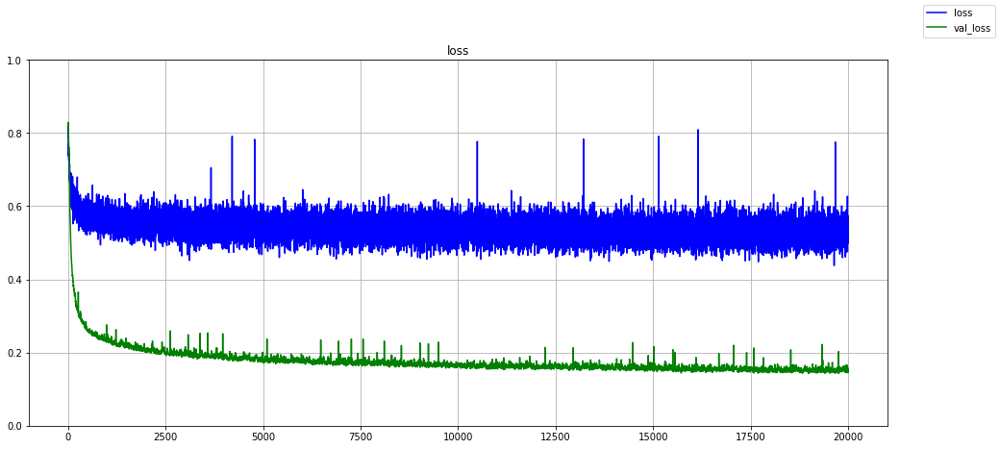

In [ ]:
def plot_metrics(metric_name, title, ylim=5):
    '''plots a given metric from the model history'''
    plt.figure(figsize=(16, 7))
    plt.title(title)
    plt.ylim(0,ylim)
    plt.plot(history[metric_name],color='blue',label=metric_name)
    plt.plot(history['val_' + metric_name],color='green',label='val_' + metric_name)
    plt.figlegend()
    plt.grid()

plot_metrics('loss', 'loss', ylim=1)

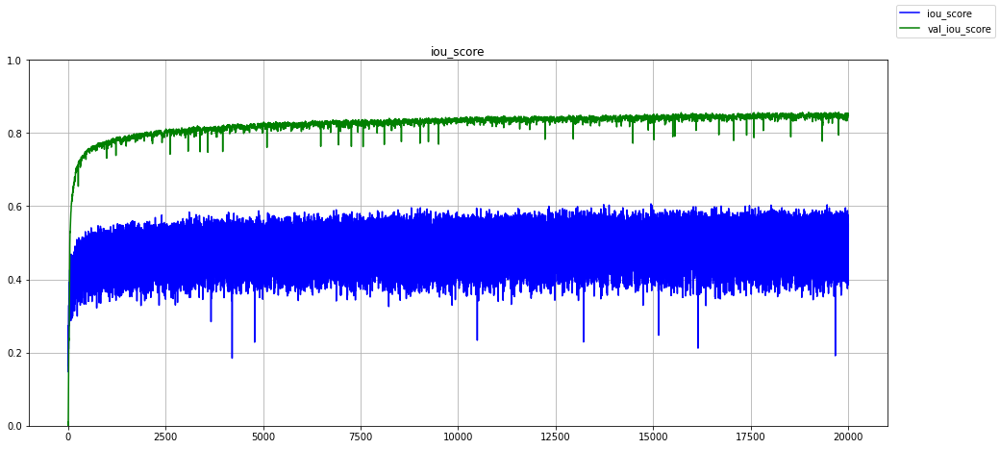

In [ ]:
plot_metrics('iou_score', 'iou_score', ylim=1)

Idea11_dataset3x3_V1::densenet121_Vessel_V1_001: train 1000 epochs, Vessel detection, Dataset6x6mm 104 images, for detecting small capillaries and adding them to the ground truths for Dataset3x3 

Idea11_dataset3x3_V2::densenet121_Idea11_V2T1_001: train 15000 epochs, OCTA only architecture, training 1 fold, Dataset3x3mm 46 images, iou_loss-MC, iou for test= 0.8025 

Idea11_dataset3x3_V3::densenet121_Idea11_V3T1_001: train 20000 epochs, OCTA only architecture, training total images for generating AV-map for Hseih's Dataset, Dataset3x3mm 46 images, iou_loss-MC, iou for test= 0.8485,

Idea11_dataset3x3_V4::densenet121_Vessel_Idea11_V4T1_001: train 1000 epochs, Vessel detection, Dataset3x3mm 46 images, for detecting small capillaries and adding them to the ground truths for Hseih's Dataset

In [ ]:
print('Loss: mean:', repr(np.mean(loss_per_fold)),', Per fold:' , repr(loss_per_fold))
print('IOU: mean:', repr(np.mean(iou_per_fold)),', Per fold:' , repr(iou_per_fold))
print('F1: mean:', repr(np.mean(F1_per_fold)),', Per fold:' , repr(F1_per_fold))
print('Accuracy: mean:', repr(np.mean(acc_per_fold)),', Per fold:' , repr(acc_per_fold))


Loss: mean: 0.8260275721549988 , Per fold: [0.8260275721549988]
IOU: mean: 0.009937925264239311 , Per fold: [0.009937925264239311]
F1: mean: 0.01930043287575245 , Per fold: [0.01930043287575245]
Accuracy: mean: 0.8231948614120483 , Per fold: [0.8231948614120483]


In [ ]:
def inv_classification_map(labels):
    image=np.zeros(labels.shape)
    for i in range(labels.shape[0]):
        for j in range(labels.shape[1]):
            if (labels[i,j,0]>0.5 and labels[i,j,1]<0.5 and labels[i,j,2]<0.5):
                image[i,j,:]=[255,0,0]
            elif (labels[i,j,0]<0.5 and labels[i,j,1]<0.5 and labels[i,j,2]>0.5):
                image[i,j,:]=[0,255,255]
            else:
                image[i,j,:]=[0,0,0]

    return image

In [ ]:
def make_predictions_IO(filename, INPUT_DIR, OUTPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    file_OCT_OCTA = INPUT_DIR + filename[:-4] + '.png'
    file_AV_map = OUTPUT_DIR + filename[:-4] + '.png'
    im_OCT_OCTA = Image.open(file_OCT_OCTA)
    im_AV_map = Image.open(file_AV_map)
    im_OCT_OCTA = np.array(im_OCT_OCTA)/255.0
    im_AV_map = np.array(im_AV_map)/255.0
    print(im_AV_map.shape)

    im_OCT_OCTA[:,:,0]=0

    MeanIOU =[]
    impred=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    for i in range(div):
        for j in range(div):
            im_OCT_OCTA_e=im_OCT_OCTA[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_OCTA_e = np.reshape(im_OCT_OCTA_e,(1, im_OCT_OCTA_e.shape[0], im_OCT_OCTA_e.shape[1], im_OCT_OCTA_e.shape[2]))
            impred[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_OCT_OCTA_e)
         
    impredinv = inv_classification_map(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))   
    AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))   
    # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    iouMC1 = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 1)), impred).numpy()
    # impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
    # GT_vessels = VesselsMask(im_AV_map)
    # iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
    #                                                   np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
    # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
    
    # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # metric = tf.keras.metrics.MeanIoU(num_classes=2)
    # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
    # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
    # MeanIOU.append(iouMC1)

    print(filename[:-4])
    print('meanIOU  = ', iouMC1)
    # print('IOU coef per class = ', iou_perclass)
    # print('IOU coef for vessels = ', iou_vessels)

    plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
    display_list = [np.expand_dims(im_OCT_OCTA[:,:,0], axis=2), np.expand_dims(im_OCT_OCTA[:,:,1], axis=2), 
                     AV_map_inv, impredinv]
    titles=['OCT', 'OCTA', 'Ground Truth', 'Predicted (meanIOU= '+str(iouMC1)+')']
    cmaps = ['gray', 'gray', 'viridis', 'viridis']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)


    return impred
            

(320, 320, 3)
CONTROL-048
meanIOU  =  0.8497593


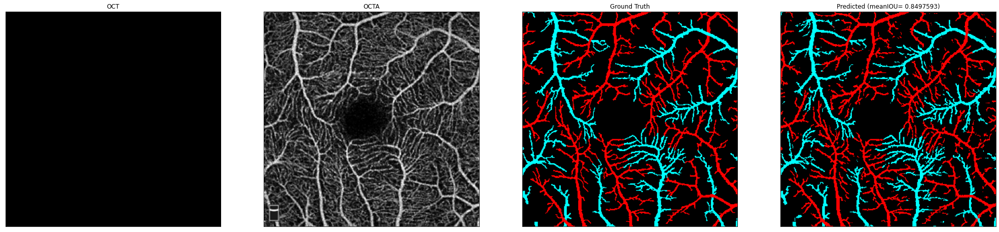

In [ ]:
filename = (df_train.sample()).iloc[0,0]
# filename = 'control_024.png'
INPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\Input\\'
OUTPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\AV_map\\'

impred = make_predictions_IO(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 3)
CONTROL-036
meanIOU  =  0.85119396


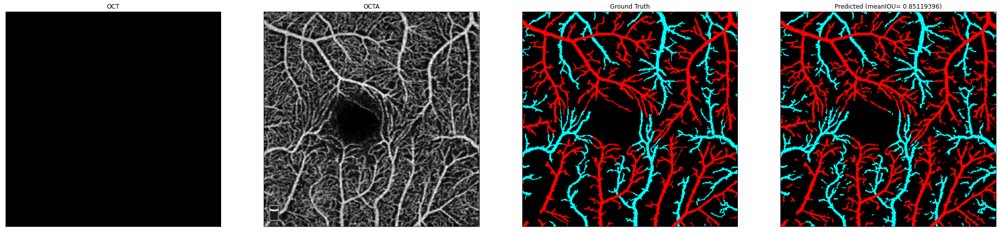

In [ ]:
filename = (df_val.sample()).iloc[0,0]
# filename = 'moderate_014.png'
INPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\Input\\'
OUTPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\AV_map\\'

impred = make_predictions_IO(filename, INPUT_DIR, OUTPUT_DIR)

In [ ]:
def inv_classification_map(labels):
    image=np.zeros(labels.shape)
    for i in range(labels.shape[0]):
        for j in range(labels.shape[1]):
            if (labels[i,j,0]>0.5 and labels[i,j,1]<0.5 and labels[i,j,2]<0.5):
                image[i,j,:]=[255,0,0]
            elif (labels[i,j,0]<0.5 and labels[i,j,1]<0.5 and labels[i,j,2]>0.5):
                image[i,j,:]=[0,255,255]
            else:
                image[i,j,:]=[0,0,0]

    return image

In [ ]:
def make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    file_OCTA = INPUT_DIR + filename + '.png'
    file_AV_map = OUTPUT_DIR + filename + '.png'
    im_OCTA = Image.open(file_OCTA)
    im_OCTA = im_OCTA.convert('L')
    im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCTA = np.array(im_OCTA, dtype=np.float32)
    im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    im_zero = np.zeros((imagesize, imagesize))
    im_OCTA = np.expand_dims(im_OCTA, axis=2)
    im_zero = np.expand_dims(im_zero, axis=2)
    im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    # im_AV_map = Image.open(file_AV_map)
    im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    # im_AV_map = np.array(im_AV_map)/255.0


    MeanIOU =[]
    impredIO=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    
    for i in range(div):
        for j in range(div):
            im_zero_OCTA_zero_e=im_zero_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_zero_OCTA_zero_e = np.reshape(im_zero_OCTA_zero_e,(1, im_zero_OCTA_zero_e.shape[0], im_zero_OCTA_zero_e.shape[1], im_zero_OCTA_zero_e.shape[2]))
            impredIO[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_zero_OCTA_zero_e)
         
    # impredinv = inv_classification_map(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))
    
    impredIO304 = tf.image.resize(impredIO, (304,304))
    impredIOinv = inv_classification_map(np.reshape(impredIO,(impredIO.shape[1], impredIO.shape[2], impredIO.shape[3])))    
    impredIOinv304 = inv_classification_map(np.reshape(impredIO304,(impredIO304.shape[1], impredIO304.shape[2], impredIO304.shape[3])))      
    # impred_Vessels = np.reshape(impred_Vessels,(impred_Vessels.shape[1], impred_Vessels.shape[2], impred_Vessels.shape[3]))
    # AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
    # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # iouMC1 = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
    # GT_vessels = VesselsMask(im_AV_map)
    # iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
    #                                                   np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
    # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
    
    # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # metric = tf.keras.metrics.MeanIoU(num_classes=2)
    # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
    # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
    # MeanIOU.append(iouMC1)

    print(filename)
    # print('meanIOU  = ', iouMC1)
    # print('IOU coef per class = ', iou_perclass)
    # print('IOU coef for vessels = ', iou_vessels)
    Thre = 0.5
    # Image.fromarray(np.squeeze((255.0*im_OCT_OCTA_zero[:,:,0]).astype(np.uint8)), mode="L")
    # Image.fromarray(np.squeeze((255.0*im_zero_OCTA_zero[:,:,1]).astype(np.uint8)), mode="L").save(INPUT_DIR+filename+'_OCTA.tiff')
    # print(impredIOinv.shape)
    # print(impredIOinv[50:60,100:110,:])
    # Image.fromarray(np.squeeze((impredIOinv).astype(np.uint8))).save(INPUT_DIR+filename+'_AVmapOCTAonly320.tiff')
    # impredIOinv320 = Image.fromarray(impredIOinv)
    
    
    # impredIOinv320 = Image.open(INPUT_DIR+filename+'_AVmapOCTAonly.tiff')
    
    # impredIOinv320.show()
    # impredIOinv320.save(INPUT_DIR+filename+'_AVmapOCTAonly1.tiff')
    # impredIOinv304 = impredIOinv320.resize((304, 304), resample=0)
    # impredIOinv304.show()
    # impredIOinv304 = np.array(impredIOinv304, dtype=np.float32)
    # print(impredIOinv304[60,100:150,:])
    # print(impredIOinv304.shape)
    Image.fromarray(np.squeeze((impredIOinv304).astype(np.uint8))).save(INPUT_DIR+filename+'_AVmapOCTAonly304.tiff')

    # plt.figure(figsize=(20, 20)).patch.set_facecolor('white')
    # display_list = [np.expand_dims(im_zero_OCTA_zero[:,:,1], axis=2), impredIOinv]
    # # display_list = [np.expand_dims(im_zero_OCTA_zero[:,:,1], axis=2), np.where(np.expand_dims(FrFi[0], axis=2)>0.1,1,0), impredIOinv]
    # titles=['OCTA', 'Predicted by OCTA Only architecture trained by 3x3mm images']
    # for i in range(len(display_list)):
    #     plt.subplot(1, len(display_list), i+1)
    #     plt.title(titles[i])
    #     plt.xticks([])
    #     plt.yticks([])
    #     img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
    #     plt.imshow(img_arr)


    return impredIOinv
            

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_Rossi_Alfa__8308_Angio Retina_OD_2022-01-12_18-23-47_M_1990-06-06_Enface-304x304-Superficial-CONTROL8x8-068'
INPUT_DIR = 'D:\\AV Project\\Dataset8x8mm\\Control\\OCTA\\'
OUTPUT_DIR = 'D:\\AV Project\\Dataset8x8mm\\Control\\OCTA\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

_Rossi_Alfa__8308_Angio Retina_OD_2022-01-12_18-23-47_M_1990-06-06_Enface-304x304-Superficial-CONTROL8x8-068


0678890 盧欽宗 ou after 4


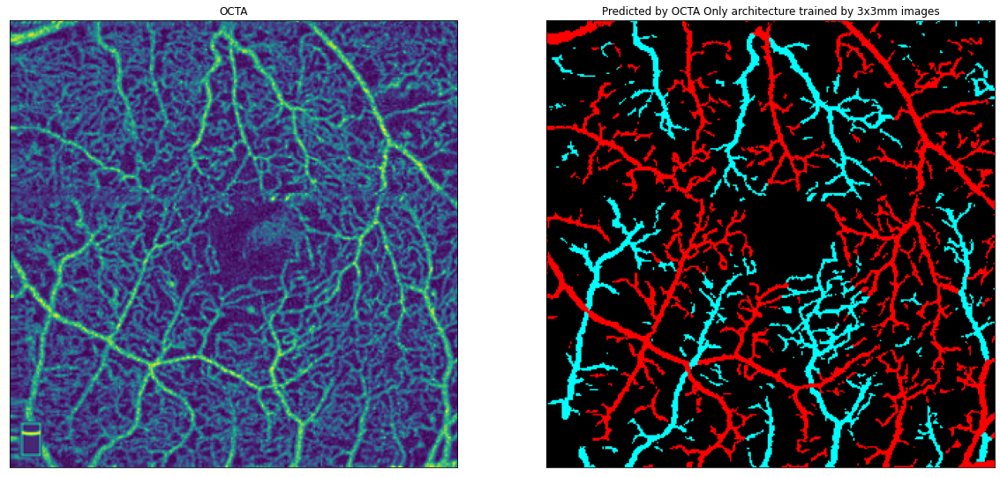

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '0678890 盧欽宗 ou after 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\0678890 盧欽宗 ou after 1\\OS\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\0678890 盧欽宗 ou after 1\\OS\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

6210431 程俊發 os aft


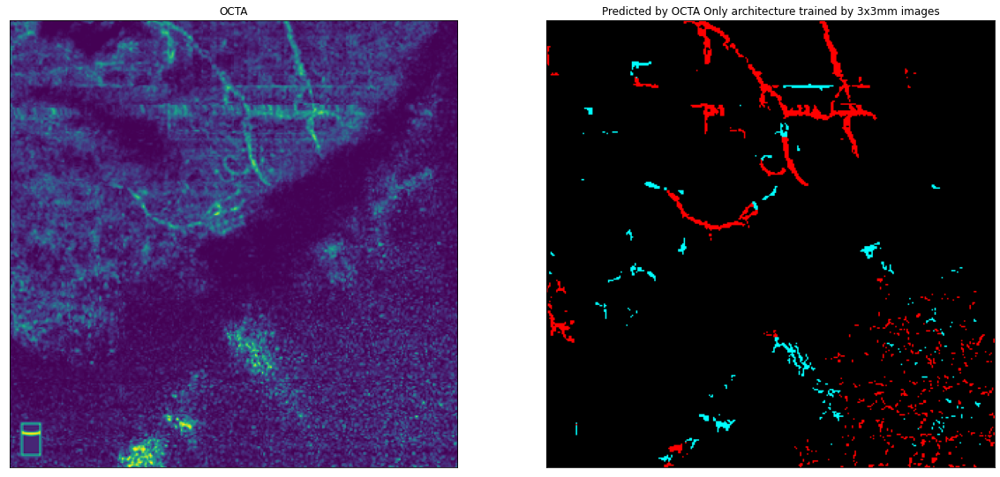

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '6210431 程俊發 os after 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\6210431 程俊發 os after 1\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\6210431 程俊發 os after 1\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

_4502947_4502947__15025_Angio Retina_OS_2017-07-27_10-49-10_F_1938-10-29_Enface-304x304-Superfi


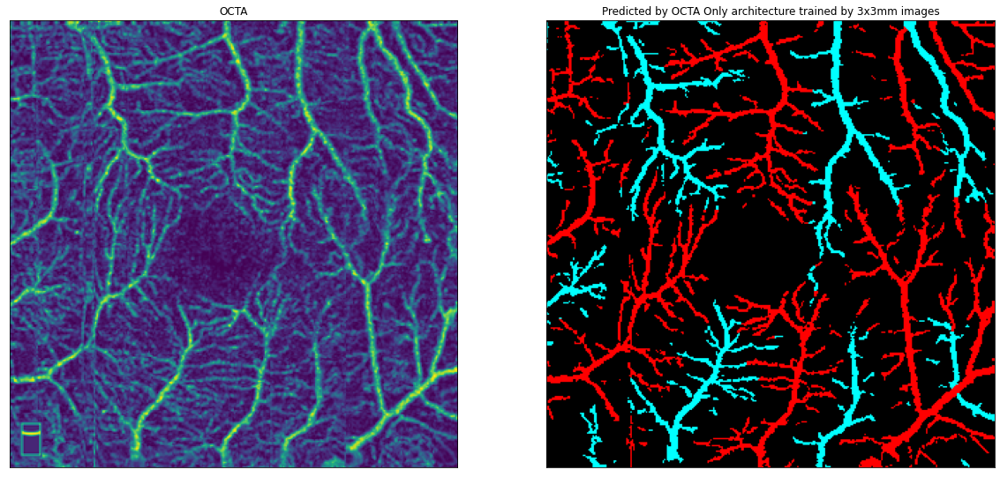

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_4502947_4502947__15025_Angio Retina_OS_2017-07-27_10-49-10_F_1938-10-29_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\01. 黃翁月華_20170727(OS)\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\01. 黃翁月華_20170727(OS)\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

_6342852_6342852__4971_Angio Retina_OD_2016-08-24_16-50-22_F_1951-04-10_Enface-304x304-Superfi


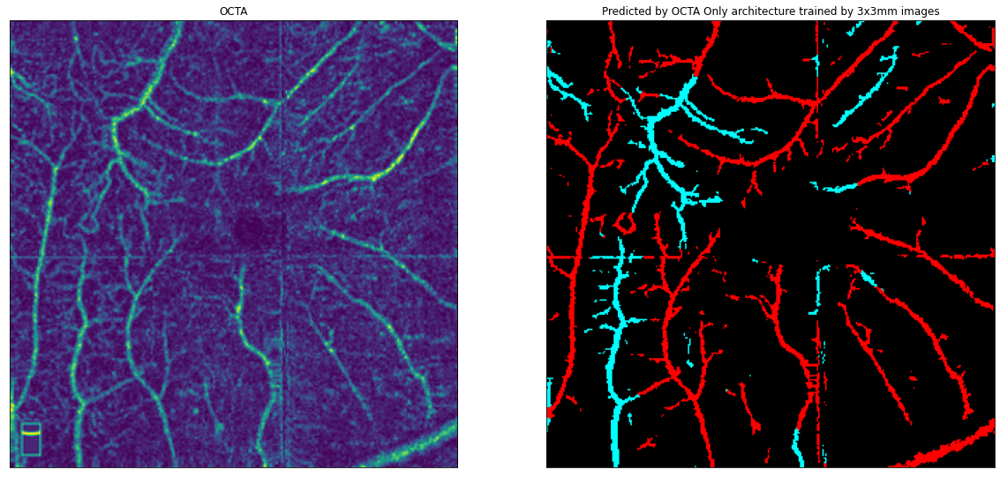

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_6342852_6342852__4971_Angio Retina_OD_2016-08-24_16-50-22_F_1951-04-10_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\04. 蘇麗玉_20160824(OD)\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\04. 蘇麗玉_20160824(OD)\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

3729372鄧小明 ou befo


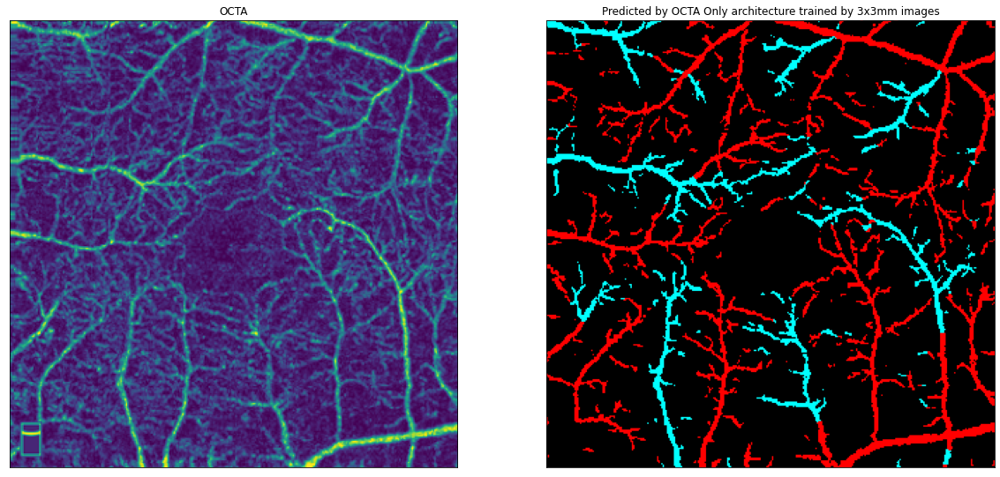

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '3729372鄧小明 ou before 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\3729372鄧小明 ou before 1\\OS\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\3729372鄧小明 ou before 1\\OS\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

_1612563_1612563__16911_Angio Retina_OS_2017-09-18_14-41-03_F_1952-10-10_Enface-304x304-Superfi


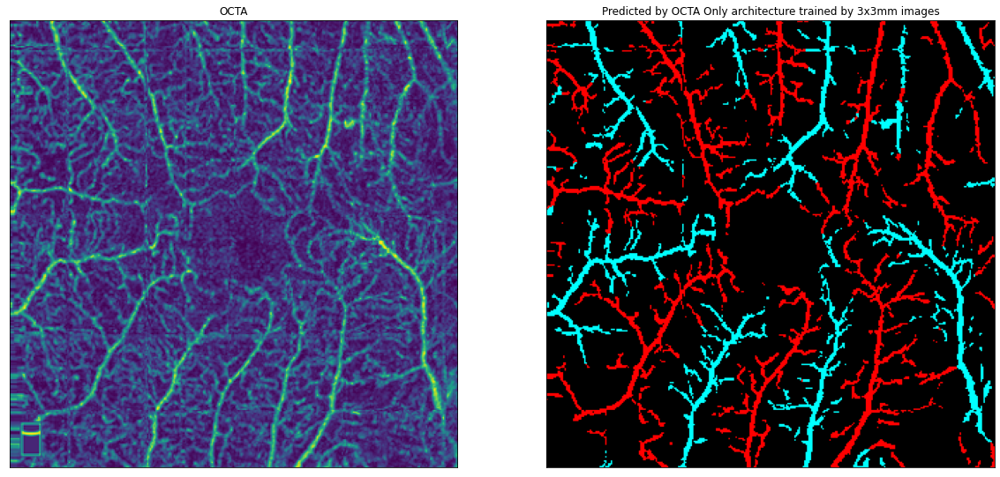

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_1612563_1612563__16911_Angio Retina_OS_2017-09-18_14-41-03_F_1952-10-10_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\21. 錢素貞_20170918(OS)\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\21. 錢素貞_20170918(OS)\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

6159786 賴惠玲 od befo


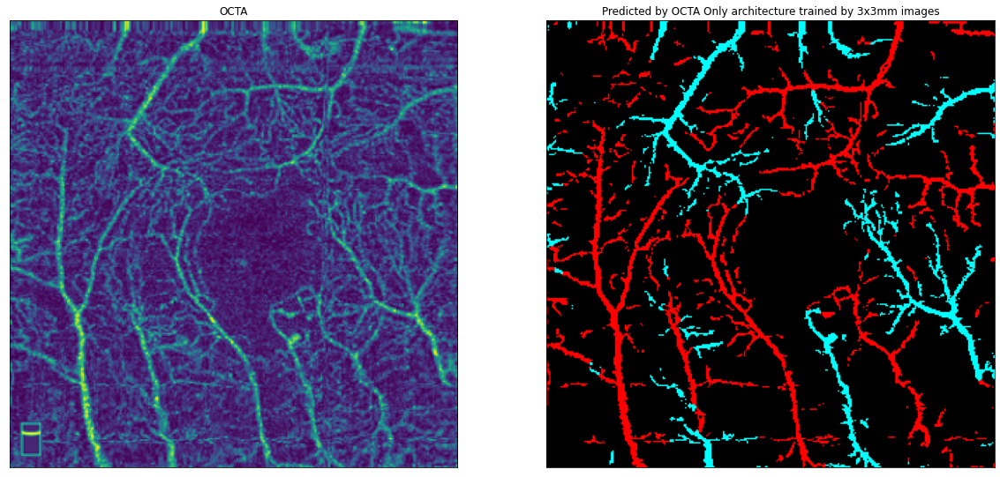

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '6159786 賴惠玲 od before 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\6159786 賴惠玲 od before 1\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\6159786 賴惠玲 od before 1\\'

impred = make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename, INPUT_DIR, OUTPUT_DIR)

In [ ]:
filename='_2046225_2046225__11336_Angio Retina_OD_2022-08-03_12-05-27_F_1957-09-21_Enface-304x304-Superficial.png'
filename[-5]

'l'

In [ ]:

for subfolder in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20230307\\'):
   for subfolder2 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20230307\\'+subfolder+'\\'):
      for subfolder3 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20230307\\'+subfolder+'\\'+subfolder2+'\\'):
          if subfolder3=='OD' or subfolder3=='OS':
            for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20230307\\'+subfolder+'\\'+subfolder2+'\\'+subfolder3+'\\'):
                if filename[-5]=='l':
                    INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20230307\\'+subfolder+'\\'+subfolder2+'\\'+subfolder3+'\\'

                    make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename[:-4], INPUT_DIR, INPUT_DIR)


_2046225_2046225__11336_Angio Retina_OD_2022-08-03_12-05-27_F_1957-09-21_Enface-304x304-Superficial
_2046225_2046225__11336_Angio Retina_OS_2022-08-03_12-06-50_F_1957-09-21_Enface-304x304-Superficial
_2046225_2046225__18681_Angio Retina_OD_2022-11-04_09-14-06_F_1957-09-21_Enface-304x304-Superficial
_2046225_2046225__18681_Angio Retina_OS_2022-11-04_09-16-25_F_1957-09-21_Enface-304x304-Superficial
_2057442_2057442__5630_HD Angio Retina_OS_2022-05-11_09-27-52_F_1960-08-27_Enface-400x400-Superficial
_2057442_2057442__40929_HD Angio Retina_OS_2022-08-03_08-57-04_F_1960-08-27_Enface-400x400-Superficial
_2673557_2673557__44669_Angio Retina_OS_2022-11-25_15-04-42_F_1937-07-05_Enface-304x304-Superficial
_3174135_3174135__41203_Angio Retina_OD_2022-08-11_08-55-35_F_1942-02-09_Enface-304x304-Superficial
_3174135_3174135__41203_Angio Retina_OS_2022-08-11_08-56-57_F_1942-02-09_Enface-304x304-Superficial
_3395379_3395379__18009_HD Angio Retina_OD_2022-10-26_15-59-24_M_1978-03-31_Enface-400x400-Supe

In [ ]:

for subfolder in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\'):
   for subfolder2 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\'+subfolder+'\\'):
      if subfolder2=='OD' or subfolder2=='OS':
         for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\'+subfolder+'\\'+subfolder2+'\\'):
             if filename[-5]=='4':
                 INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\'+subfolder+'\\'+subfolder2+'\\'

                 make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename[:-4], INPUT_DIR, INPUT_DIR)
      else:
         for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\'+subfolder+'\\'):
             if filename[-5]=='4':
                 INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\'+subfolder+'\\'

                 make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename[:-4], INPUT_DIR, INPUT_DIR)


0678890 盧欽宗 ou after 4
0678890 盧欽宗 ou after 4
0678890 盧欽宗 ou before 4
0678890 盧欽宗 ou before 4
1523393 戴尚仁 od after 4
1523393 戴尚仁 od after 4
1523393 戴尚仁 od after 4
1523393 戴尚仁 od after 4
1523393 戴尚仁 od before 4
1523393 戴尚仁 od before 4
1523393 戴尚仁 od before 4
1523393 戴尚仁 od before 4
2536827 黃徐梅招 od after 4
2536827 黃徐梅招 od after 4
2536827 黃徐梅招 od after 4
2536827 黃徐梅招 od after 4
2536827 黃徐梅招 od before 4
2536827 黃徐梅招 od before 4
2536827 黃徐梅招 od before 4
2536827 黃徐梅招 od before 4
2600699 沈淑瓊 os after 4
2600699 沈淑瓊 os after 4
2600699 沈淑瓊 os after 4
2600699 沈淑瓊 os after 4
2600699 沈淑瓊 os before 4
2600699 沈淑瓊 os before 4
2600699 沈淑瓊 os before 4
2600699 沈淑瓊 os before 4
2610470陳靜慧od after 4
2610470陳靜慧od after 4
2610470陳靜慧od after 4
2610470陳靜慧od after 4
2610470陳靜慧od before 4
2610470陳靜慧od before 4
2610470陳靜慧od before 4
2610470陳靜慧od before 4
2610470陳靜慧os after 4
2610470陳靜慧os after 4
2610470陳靜慧os after 4
2610470陳靜慧os after 4
2610470陳靜慧os before 4
2610470陳靜慧os before 4
2610470陳靜慧os before 4
2610470陳靜慧os

In [ ]:
for subfolder in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'):
  #  for subfolder2 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'+subfolder+'\\'):
  for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'+subfolder+'\\'):
      if filename[-5]=='l':
          INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'+subfolder+'\\'

          make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename[:-4], INPUT_DIR, INPUT_DIR)

_4502947_4502947__11284_Angio Retina_OS_2017-04-10_11-18-58_F_1938-10-29_Enface-304x304-Superficial
_4502947_4502947__15025_Angio Retina_OS_2017-07-27_10-49-10_F_1938-10-29_Enface-304x304-Superficial
_3851405_3851405__4635_Angio Retina_OS_2016-08-03_14-12-28_M_1962-01-10_Enface-304x304-Superficial
_3851405_3851405__15686_Angio Retina_OS_2017-08-15_10-25-11_M_1962-01-10_Enface-304x304-Superficial
_3851405_3851405__4635_Angio Retina_OD_2016-08-03_14-10-51_M_1962-01-10_Enface-304x304-Superficial
_3851405_3851405__15686_Angio Retina_OD_2017-08-15_10-22-57_M_1962-01-10_Enface-304x304-Superficial
_6342852_6342852__4971_Angio Retina_OD_2016-08-24_16-50-22_F_1951-04-10_Enface-304x304-Superficial
_6342852_6342852__11853_Angio Retina_OD_2017-04-26_10-13-14_F_1951-04-10_Enface-304x304-Superficial
_5931061_5931061__4668_Angio Retina_OS_2016-08-05_15-46-17_M_1954-07-01_Enface-304x304-Superficial
_5931061_5931061__9780_Angio Retina_OS_2017-02-17_15-51-13_M_1954-07-01_Enface-304x304-Superficial
_5931

In [ ]:

for subfolder in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'):
   for subfolder2 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'+subfolder+'\\'):
      if subfolder2=='OD' or subfolder2=='OS':
         for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'+subfolder+'\\'+subfolder2+'\\'):
             if filename[-5]=='l':
                 INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'+subfolder+'\\'+subfolder2+'\\'

                 make_predictions_3x3mmOCTAOnly_for_HsiehDataset(filename[:-4], INPUT_DIR, INPUT_DIR)

075558262_Piemonte_Fred__2046_Angio Retina_OS_2017-07-20_08-10-26_M_1937-09-04_Enface-304x304-Superficial
080781789_McClarin_Beatrice__2045_Angio Retina_OD_2017-07-20_07-51-48_F_1937-02-01_Enface-304x304-Superficial
080781789_McClarin_Beatrice__2045_Angio Retina_OS_2017-07-20_07-48-12_F_1937-02-01_Enface-304x304-Superficial
080942930_Barajas_Concepcion__1884_Angio Retina_OS_2017-06-26_09-39-53_F_1956-07-04_Enface-304x304-Superficial
081193264_Seidler_John__2008_Angio Retina_OD_2017-07-13_10-57-38_M_1944-07-01_Enface-304x304-Superficial
_1766988_1766988__23593_Angio Retina_OD_2018-03-19_11-47-25_F_1946-09-10_Enface-304x304-Superficial
_1766988_1766988__23593_Angio Retina_OS_2018-03-19_11-48-49_F_1946-09-10_Enface-304x304-Superficial
_2464171_2464171__23676_Angio Retina_OD_2018-03-21_12-38-15_F_1943-08-01_Enface-304x304-Superficial
_2464171_2464171__23676_Angio Retina_OS_2018-03-21_12-41-32_F_1943-08-01_Enface-304x304-Superficial
_5354728_5354728__23420_Angio Retina_OD_2018-03-14_12-19-1

In [ ]:
def Mapping_AV_map_On_OCTA(OCTA, AV_map):
    # image=np.zeros(AV_map.shape)
    for i in range(OCTA.shape[0]):
        for j in range(OCTA.shape[1]):
            if (AV_map[i,j,0]>127 or AV_map[i,j,1]>127 or AV_map[i,j,2]>127):
                OCTA[i,j,:]=AV_map[i,j,:]

    return OCTA

In [ ]:
def Combining_OCTA_and_AVmap(filename, INPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    file_OCTA = INPUT_DIR + filename + '.png'
    # file_AV_map = INPUT_DIR + filename + '_AVmapCombine304.tiff'
    file_AV_map = INPUT_DIR + filename + '_AVmapOCTAonly304.tiff'
    im_OCTA = Image.open(file_OCTA)
    # im_OCTA = im_OCTA.convert('L')
    # im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCTA = np.array(im_OCTA, dtype=np.float32)
    im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    # im_zero = np.zeros((imagesize, imagesize))
    # im_OCTA = np.expand_dims(im_OCTA, axis=2)
    # im_zero = np.expand_dims(im_zero, axis=2)
    # im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    im_AV_map = Image.open(file_AV_map)
    # im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    im_AV_map = np.array(im_AV_map)

    print(filename, im_OCTA[:,:,0:3].shape, im_AV_map[:,:,0:3].shape)
    im_AVmap_on_OCTA=Mapping_AV_map_On_OCTA(im_OCTA[:,:,0:3], im_AV_map[:,:,0:3])




    Image.fromarray(np.squeeze((im_AVmap_on_OCTA).astype(np.uint8))).save(INPUT_DIR+filename+'_AVmap_on_OCTA.tiff')


    return im_AVmap_on_OCTA
            

In [ ]:
filename = '_6472127_6472127__14637_Angio Retina_OD_2017-07-17_11-14-21_F_1953-10-16_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\11. 林燕玉_20170717(OD)\\'

impred = Combining_OCTA_and_AVmap(filename, INPUT_DIR)

_6472127_6472127__14637_Angio Retina_OD_2017-07-17_11-14-21_F_1953-10-16_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)


In [ ]:
for subfolder in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'):
  #  for subfolder2 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'+subfolder+'\\'):
  for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'+subfolder+'\\'):
      if filename[-5]=='l':
          INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\'+subfolder+'\\'

          Combining_OCTA_and_AVmap(filename[:-4], INPUT_DIR)

_4502947_4502947__11284_Angio Retina_OS_2017-04-10_11-18-58_F_1938-10-29_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_4502947_4502947__15025_Angio Retina_OS_2017-07-27_10-49-10_F_1938-10-29_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_3851405_3851405__4635_Angio Retina_OS_2016-08-03_14-12-28_M_1962-01-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_3851405_3851405__15686_Angio Retina_OS_2017-08-15_10-25-11_M_1962-01-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_3851405_3851405__4635_Angio Retina_OD_2016-08-03_14-10-51_M_1962-01-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_3851405_3851405__15686_Angio Retina_OD_2017-08-15_10-22-57_M_1962-01-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_6342852_6342852__4971_Angio Retina_OD_2016-08-24_16-50-22_F_1951-04-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_6342852_6342852__11853_Angio Retina_OD_2017-04-26_10-13-14_F_1951-04-10_Enface-304x304-Superficial (304, 3

In [ ]:

for subfolder in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'):
   for subfolder2 in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'+subfolder+'\\'):
      if subfolder2=='OD' or subfolder2=='OS':
         for filename in os.listdir('D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'+subfolder+'\\'+subfolder2+'\\'):
             if filename[-5]=='l':
                 INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\'+subfolder+'\\'+subfolder2+'\\'

                 Combining_OCTA_and_AVmap(filename[:-4], INPUT_DIR)

075558262_Piemonte_Fred__2046_Angio Retina_OS_2017-07-20_08-10-26_M_1937-09-04_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
080781789_McClarin_Beatrice__2045_Angio Retina_OD_2017-07-20_07-51-48_F_1937-02-01_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
080781789_McClarin_Beatrice__2045_Angio Retina_OS_2017-07-20_07-48-12_F_1937-02-01_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
080942930_Barajas_Concepcion__1884_Angio Retina_OS_2017-06-26_09-39-53_F_1956-07-04_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
081193264_Seidler_John__2008_Angio Retina_OD_2017-07-13_10-57-38_M_1944-07-01_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_1766988_1766988__23593_Angio Retina_OD_2018-03-19_11-47-25_F_1946-09-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_1766988_1766988__23593_Angio Retina_OS_2018-03-19_11-48-49_F_1946-09-10_Enface-304x304-Superficial (304, 304, 3) (304, 304, 3)
_2464171_2464171__23676_Angio Retina_OD_2018-03-21_12-38-15_F_

In [ ]:
def Extracting_AV_map_from_OCTAAVmap(OCTAAV_map):
    image=np.zeros(OCTAAV_map.shape)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (OCTAAV_map[i,j,0]>200 and OCTAAV_map[i,j,1]<50 and OCTAAV_map[i,j,2]<50):
                image[i,j,:]=[255,0,0]
            if (OCTAAV_map[i,j,0]<50 and OCTAAV_map[i,j,1]>200 and OCTAAV_map[i,j,2]>200):
                image[i,j,:]=[0,255,255]

    return image

In [ ]:
def Extracting_AVmap(filename, INPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    file_OCTAAV_map = INPUT_DIR + filename + '_AVmap_on_OCTA_PM.tiff'
    # file_AV_map = INPUT_DIR + filename + '_AVmap_on_OCTA_MM.tiff'
    im_OCTAAV_map = Image.open(file_OCTAAV_map)
    # im_OCTA = im_OCTA.convert('L')
    # im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCTAAV_map = np.array(im_OCTAAV_map, dtype=np.float32)
    # im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    # im_zero = np.zeros((imagesize, imagesize))
    # im_OCTA = np.expand_dims(im_OCTA, axis=2)
    # im_zero = np.expand_dims(im_zero, axis=2)
    # im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    # im_AV_map = Image.open(file_AV_map)
    # im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    # im_AV_map = np.array(im_AV_map)

    print(filename, im_OCTAAV_map[:,:,0:3].shape)
    im_AVmap=Extracting_AV_map_from_OCTAAVmap(im_OCTAAV_map[:,:,0:3])




    Image.fromarray(np.squeeze((im_AVmap).astype(np.uint8))).save(INPUT_DIR+filename+'_AVmap_on_OCTA_MM.tiff')


    return im_AVmap
            

In [ ]:
filename = '_Toslak_Devrim__697_Angio Retina_OS_2016-09-09_16-22-31_M_1976-05-21_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\Control\\OCTA_20180518\\Toslak_Devrim\\OS\\'

impred = Extracting_AVmap(filename, INPUT_DIR)

_Toslak_Devrim__697_Angio Retina_OS_2016-09-09_16-22-31_M_1976-05-21_Enface-304x304-Superficial (304, 304, 3)


In [ ]:
filename = '_4607119_4607119__16116_Angio Retina_OS_2017-08-25_16-21-14_M_1961-12-20_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20190203\\13. 高一峯_20170825(OS)\\'

impred = Extracting_AVmap(filename, INPUT_DIR)

_4607119_4607119__16116_Angio Retina_OS_2017-08-25_16-21-14_M_1961-12-20_Enface-304x304-Superficial (304, 304, 3)


In [ ]:
def Combining_OCTA_and_AVmap_for_enhancing_Groundtruthes(filename, INPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    file_OCTA = INPUT_DIR + 'OCTA\\' + filename + '.png'
    file_AV_map = INPUT_DIR + 'AV_map\\' + filename + '.tiff'
    im_OCTA = Image.open(file_OCTA)
    # im_OCTA = im_OCTA.convert('L')
    im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCTA = np.array(im_OCTA, dtype=np.float32)
    im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    # im_zero = np.zeros((imagesize, imagesize))
    # im_OCTA = np.expand_dims(im_OCTA, axis=2)
    # im_zero = np.expand_dims(im_zero, axis=2)
    # im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    im_AV_map = Image.open(file_AV_map)
    # im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    im_AV_map = np.array(im_AV_map)

    print(filename, im_OCTA[:,:,0:3].shape, im_AV_map[:,:,0:3].shape)
    im_AVmap_on_OCTA=Mapping_AV_map_On_OCTA(im_OCTA[:,:,0:3], im_AV_map[:,:,0:3])




    Image.fromarray(np.squeeze((im_AVmap_on_OCTA).astype(np.uint8))).save(INPUT_DIR+ 'AV_map\\' + filename+'_AVmap_on_OCTA.tiff')


    return im_AVmap_on_OCTA
            

In [ ]:
filename = 'CONTROL-074'
INPUT_DIR = 'D:\\AV Project\\Dataset3x3mm\\Control\\'

impred = Combining_OCTA_and_AVmap_for_enhancing_Groundtruthes(filename, INPUT_DIR)

CONTROL-074 (320, 320, 3) (320, 320, 3)


In [ ]:
def Extracting_AVmap_from_enhanced_Groundtruthes(filename, INPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    file_OCTAAV_map = INPUT_DIR + 'AV_map\\' + filename + '_PM.tiff'
    # file_AV_map = INPUT_DIR + filename + '_AVmap_on_OCTA_MM.tiff'
    im_OCTAAV_map = Image.open(file_OCTAAV_map)
    # im_OCTA = im_OCTA.convert('L')
    # im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCTAAV_map = np.array(im_OCTAAV_map, dtype=np.float32)
    # im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    # im_zero = np.zeros((imagesize, imagesize))
    # im_OCTA = np.expand_dims(im_OCTA, axis=2)
    # im_zero = np.expand_dims(im_zero, axis=2)
    # im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    # im_AV_map = Image.open(file_AV_map)
    # im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    # im_AV_map = np.array(im_AV_map)

    print(filename, im_OCTAAV_map[:,:,0:3].shape)
    im_AVmap=Extracting_AV_map_from_OCTAAVmap(im_OCTAAV_map[:,:,0:3])




    Image.fromarray(np.squeeze((im_AVmap).astype(np.uint8))).save(INPUT_DIR+ 'AV_map\\' +filename+'_MM.tiff')


    return im_AVmap
            

In [ ]:
filename = 'CONTROL-051'
INPUT_DIR = 'D:\\AV Project\\Dataset3x3mm\\Control\\'

impred = Extracting_AVmap_from_enhanced_Groundtruthes(filename, INPUT_DIR)

CONTROL-051 (320, 320, 3)


In [ ]:
def make_predictions_OCTA_Only(filename, INPUT_DIR, OUTPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    file_OCT_OCTA = INPUT_DIR + filename[:-4] + '.png'
    file_AV_map = OUTPUT_DIR + filename[:-4] + '.png'
    im_OCT_OCTA = Image.open(file_OCT_OCTA)
    im_AV_map = Image.open(file_AV_map)
    im_OCT_OCTA = np.array(im_OCT_OCTA)/255.0
    im_AV_map = np.array(im_AV_map)/255.0


    im_OCT_OCTA[:,:,0]=0


    MeanIOU =[]
    impred=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    for i in range(div):
        for j in range(div):
            im_OCT_OCTA_e=im_OCT_OCTA[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_OCTA_e = np.reshape(im_OCT_OCTA_e,(1, im_OCT_OCTA_e.shape[0], im_OCT_OCTA_e.shape[1], im_OCT_OCTA_e.shape[2]))
            impred[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_OCT_OCTA_e)
         
    impredinv = inv_classification_map(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))   
    AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
    # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    iouMC1 = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
    GT_vessels = VesselsMask(im_AV_map)
    iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
                                                      np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
    # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
    
    # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # metric = tf.keras.metrics.MeanIoU(num_classes=2)
    # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
    # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
    # MeanIOU.append(iouMC1)

    print(filename[:-4])
    print('meanIOU  = ', iouMC1)
    print('IOU coef per class = ', iou_perclass)
    print('IOU coef for vessels = ', iou_vessels)

    plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
    display_list = [np.expand_dims(im_OCT_OCTA[:,:,0], axis=2), np.expand_dims(im_OCT_OCTA[:,:,1], axis=2), 255.0*GT_vessels, 255.0*impred_vessels, AV_map_inv, 
                    impredinv]
    titles=['OCT', 'OCTA', 'Ground Truth Vessels', 'Predicted Vessels (IOU= '+str(iou_vessels)+')', 'Ground Truth', 'Predicted (meanIOU= '+str(iouMC1)+')\nIOU coef per class = '+str(np.around(iou_perclass,4))]
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr)


    return impred
            

CONTROL-038
meanIOU  =  0.8331501
IOU coef per class =  [0.76529163 0.9384478  0.7957455 ]
IOU coef for vessels =  0.8063844


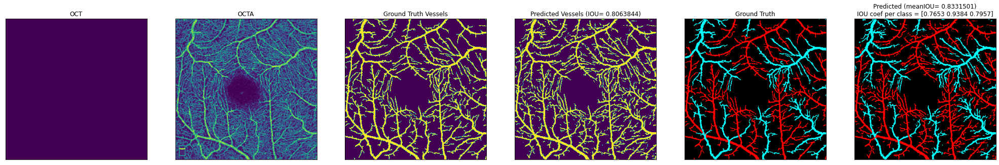

In [ ]:
filename = (df_train.sample()).iloc[0,0]
# filename = 'mild_013.png'
INPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\Input\\'
OUTPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\AV_map\\'

impred = make_predictions_OCTA_Only(filename, INPUT_DIR, OUTPUT_DIR)

In [ ]:
# parent_dir = 'D:\\AV Project'
# try:
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\Control'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Mild'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Moderate'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Severe'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\Control\\AV_map'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\Control\\OCT'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\Control\\OCT_Volume'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\Control\\OCTA'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Mild\\AV_map'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Mild\\OCT'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Mild\\OCT_Volume'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Mild\\OCTA'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Moderate\\AV_map'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Moderate\\OCT'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Moderate\\OCT_Volume'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Moderate\\OCTA'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Severe\\AV_map'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Severe\\OCT'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Severe\\OCT_Volume'))
#     os.mkdir(os.path.join(parent_dir, 'Dataset2022\\NPDR_Severe\\OCTA'))
# except OSError:
#     pass

In [ ]:
len([filename for filename in df_total['Input']])

48

In [ ]:
imagesize=320
subimagesize=320

In [ ]:

backbone = 'densenet121'
act_type = 'softmax'
image_type = 3
num_classes = 3



inp = Input(shape=(None, None, 3))

base_model = Unet(
    backbone_name = backbone,
    encoder_weights = 'imagenet',
    encoder_freeze = False,
    classes = num_classes, 
    input_shape = (None, None, image_type),
    activation = act_type, #softmax
    decoder_block_type = 'upsampling',
    decoder_use_batchnorm=True
)
#
out = base_model(inp)
#
# base_model.summary()
# New Model
modelOCTOCTA = Model(inp, out, name = base_model.name)
#
modelOCTOCTA.summary()



modelOCTOCTA.load_weights('D:\\AV Project\\AV-Net\\densenet121_V59_004\\av_4_model.5000.hdf5')

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
model_1 (Functional)         (None, None, None, 3)     12145267  
Total params: 12,145,267
Trainable params: 12,059,635
Non-trainable params: 85,632
_________________________________________________________________


In [ ]:

backbone = 'densenet121'
act_type = 'softmax'
image_type = 3
num_classes = 3



inp = Input(shape=(None, None, 3))

base_model = Unet(
    backbone_name = backbone,
    encoder_weights = 'imagenet',
    encoder_freeze = False,
    classes = num_classes, 
    input_shape = (None, None, image_type),
    activation = act_type, #softmax
    decoder_block_type = 'upsampling',
    decoder_use_batchnorm=True
)
#
out = base_model(inp)
#
# base_model.summary()
# New Model
modelOCTAOnly = Model(inp, out, name = base_model.name)
#
modelOCTAOnly.summary()



modelOCTAOnly.load_weights('D:\\AV Project\\AV-Net\\densenet121_V61_004\\av_4_model.5000.hdf5')

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
model_2 (Functional)         (None, None, None, 3)     12145267  
Total params: 12,145,267
Trainable params: 12,059,635
Non-trainable params: 85,632
_________________________________________________________________


In [ ]:

backbone = 'densenet121'
act_type = 'softmax'
image_type = 3
num_classes = 3



inp = Input(shape=(None, None, 3))

base_model = Unet(
    backbone_name = backbone,
    encoder_weights = 'imagenet',
    encoder_freeze = False,
    classes = num_classes, 
    input_shape = (None, None, image_type),
    activation = act_type, #softmax
    decoder_block_type = 'upsampling',
    decoder_use_batchnorm=True
)
#
out = base_model(inp)
#
# base_model.summary()
# New Model
modelOCTOnly = Model(inp, out, name = base_model.name)
#
modelOCTOnly.summary()



# modelOCTOnly.load_weights('D:\\AV Project\\AV-Net\\densenet121_V60_001\\av_1_model.5000.hdf5')
modelOCTOnly.load_weights('D:\\AV Project\\AV-Net\\densenet121_V60_004\\av_4_model.5000.hdf5')

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
model_3 (Functional)         (None, None, None, 3)     12145267  
Total params: 12,145,267
Trainable params: 12,059,635
Non-trainable params: 85,632
_________________________________________________________________


In [ ]:





backbone = 'densenet121'
act_type = 'softmax'
image_type = 3
num_classes = 3



inp = Input(shape=(None, None, 3))
  
split = tf.keras.layers.Lambda( lambda x: tf.split(x,num_or_size_splits=3,axis=3))(inp)
inputs0 = split[0]
inputs1 = 0.0*split[1]
inputs2 = 0.0*split[2]
# inputs2 = np.zeros((batch_size, im_shape[0], im_shape[1],1))
# inputs2 = np.expand_dims(inputs20, axis=3)
inputs_OCT_Only = tf.keras.layers.Concatenate()([inputs0, inputs1, inputs2])


inputs0 = 0.0*split[0]
inputs1 = split[1]
inputs2 = 0.0*split[2]
inputs_OCTA_Only = tf.keras.layers.Concatenate()([inputs0, inputs1, inputs2])


base_model = Unet(
    backbone_name = backbone,
    encoder_weights = 'imagenet',
    encoder_freeze = False,
    classes = num_classes, 
    input_shape = (None, None, image_type),
    activation = 'linear',
    decoder_block_type = 'upsampling',
    decoder_use_batchnorm=True
)
#
out_OCT_Only = base_model(inputs_OCT_Only)
model_OCT_Only = Model(inp, out_OCT_Only, name = base_model.name)

# model_OCT_Only.trainable = False

base_model = Unet(
    backbone_name = backbone,
    encoder_weights = 'imagenet',
    encoder_freeze = False,
    classes = num_classes, 
    input_shape = (None, None, image_type),
    activation = 'linear',
    decoder_block_type = 'upsampling',
    decoder_use_batchnorm=True
)
out_OCTA_Only = base_model(inputs_OCTA_Only)
model_OCTA_Only = Model(inp, out_OCTA_Only, name = base_model.name)

output_OCT_Only = model_OCT_Only(inp)
output_OCTA_Only = model_OCTA_Only(inp)


x = tf.keras.layers.Concatenate()([output_OCT_Only, output_OCTA_Only])
outputs = tf.keras.layers.Conv2D(num_classes, kernel_size=(1, 1), activation='softmax')(x)


modelOCTOCTAlate = Model(inp, outputs)
#
modelOCTOCTAlate.summary()



modelOCTOCTAlate.load_weights('D:\\AV Project\\AV-Net\\densenet121_V63_001\\av_1_model.99s.hdf5')

Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
model_4 (Functional)            (None, None, None, 3 12145267    input_9[0][0]                    
__________________________________________________________________________________________________
model_5 (Functional)            (None, None, None, 3 12145267    input_9[0][0]                    
__________________________________________________________________________________________________
concatenate_2 (Concatenate)     (None, None, None, 6 0           model_4[0][0]                    
                                                                 model_5[0][0]              

In [ ]:
def make_predictions_IO(filename, INPUT_DIR, OUTPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    file_OCT_OCTA = INPUT_DIR + filename[:-4] + '.png'
    file_AV_map = OUTPUT_DIR + filename[:-4] + '.png'
    im_OCT_OCTA = Image.open(file_OCT_OCTA)
    im_AV_map = Image.open(file_AV_map)
    im_OCT_OCTA = np.array(im_OCT_OCTA)/255.0
    im_AV_map = np.array(im_AV_map)/255.0
    MeanIOU =[]
    impred=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    for i in range(div):
        for j in range(div):
            im_OCT_OCTA_e=im_OCT_OCTA[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_OCTA_e = np.reshape(im_OCT_OCTA_e,(1, im_OCT_OCTA_e.shape[0], im_OCT_OCTA_e.shape[1], im_OCT_OCTA_e.shape[2]))
            impred[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_OCT_OCTA_e)
         
    impredinv = inv_classification_map(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))   
    AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
    # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    iouMC1 = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
    GT_vessels = VesselsMask(im_AV_map)
    iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
                                                      np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
    # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
    
    # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # metric = tf.keras.metrics.MeanIoU(num_classes=2)
    # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
    # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
    # MeanIOU.append(iouMC1)

    print(filename[:-4])
    print('meanIOU  = ', iouMC1)
    print('IOU coef per class = ', iou_perclass)
    print('IOU coef for vessels = ', iou_vessels)

    plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
    display_list = [np.expand_dims(im_OCT_OCTA[:,:,0], axis=2), np.expand_dims(im_OCT_OCTA[:,:,1], axis=2), 255.0*GT_vessels, 255.0*impred_vessels, AV_map_inv, 
                    impredinv]
    titles=['OCT', 'OCTA', 'Ground Truth Vessels', 'Predicted Vessels (IOU= '+str(iou_vessels)+')', 'Ground Truth', 'Predicted (meanIOU= '+str(iouMC1)+')\nIOU coef per class = '+str(np.around(iou_perclass,4))]
    cmaps = ['gray', 'gray', 'gray', 'gray', 'viridis', 'viridis']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)


    return impred
            

In [ ]:
GT_for_predicted_vessels(im_AV_map, Pred):
    image=im_AV_map
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (Pred[i,j,0]>0.5 and Pred[i,j,1]<0.5 and Pred[i,j,2]<0.5):
                image[i,j,:]=[255,0,0]
            elif (Pred[i,j,0]<0.5 and Pred[i,j,1]<0.5 and Pred[i,j,2]>0.5):
                image[i,j,:]=[0,255,255]
            else:
                image[i,j,:]=[0,0,0]

    return image

In [ ]:
def make_predictions_4Architectures(filename, INPUT_DIR, OUTPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    file_OCT_OCTA = INPUT_DIR + filename[:-4] + '.png'
    file_AV_map = OUTPUT_DIR + filename[:-4] + '.png'
    im_OCT_OCTA = Image.open(file_OCT_OCTA)
    im_AV_map = Image.open(file_AV_map)
    im_OCT_OCTA_zero = np.array(im_OCT_OCTA)/255.0
    im_zero_OCTA_zero = np.array(im_OCT_OCTA)/255.0
    im_OCT_zero_zero = np.array(im_OCT_OCTA)/255.0
    im_AV_map = np.array(im_AV_map)/255.0

    im_zero_OCTA_zero[:,:,0]=0.0
    im_OCT_zero_zero[:,:,1]=0.0

    MeanIOU =[]
    impredOCTOCTA=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredOCTAOnly=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredOCTOnly=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredOCTOCTAlate=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    
    for i in range(div):
        for j in range(div):
            im_OCT_OCTA_zero_e=im_OCT_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_OCTA_zero_e = np.reshape(im_OCT_OCTA_zero_e,(1, im_OCT_OCTA_zero_e.shape[0], im_OCT_OCTA_zero_e.shape[1], im_OCT_OCTA_zero_e.shape[2]))
            im_zero_OCTA_zero_e=im_zero_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_zero_OCTA_zero_e = np.reshape(im_zero_OCTA_zero_e,(1, im_zero_OCTA_zero_e.shape[0], im_zero_OCTA_zero_e.shape[1], im_zero_OCTA_zero_e.shape[2]))
            im_OCT_zero_zero_e=im_OCT_zero_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_zero_zero_e = np.reshape(im_OCT_zero_zero_e,(1, im_OCT_zero_zero_e.shape[0], im_OCT_zero_zero_e.shape[1], im_OCT_zero_zero_e.shape[2]))
            impredOCTOCTA[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTOCTA.predict(im_OCT_OCTA_zero_e)
            impredOCTAOnly[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTAOnly.predict(im_zero_OCTA_zero_e)
            impredOCTOnly[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTOnly.predict(im_OCT_zero_zero_e)
            impredOCTOCTAlate[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTOCTAlate.predict(im_OCT_OCTA_zero_e)

         
    impredOCTOCTAinv = inv_classification_map(np.reshape(impredOCTOCTA,(impredOCTOCTA.shape[1], impredOCTOCTA.shape[2], impredOCTOCTA.shape[3])))
    impredOCTAOnlyinv = inv_classification_map(np.reshape(impredOCTAOnly,(impredOCTAOnly.shape[1], impredOCTAOnly.shape[2], impredOCTAOnly.shape[3])))      
    impredOCTOnlyinv = inv_classification_map(np.reshape(impredOCTOnly,(impredOCTOnly.shape[1], impredOCTOnly.shape[2], impredOCTOnly.shape[3])))     
    impredOCTOCTAlateinv = inv_classification_map(np.reshape(impredOCTOCTAlate,(impredOCTOCTAlate.shape[1], impredOCTOCTAlate.shape[2], impredOCTOCTAlate.shape[3]))) 
    
    AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
    # impred_Vessels = np.reshape(impred_Vessels,(impred_Vessels.shape[1], impred_Vessels.shape[2], impred_Vessels.shape[3]))
    # AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
    # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    iouOCTOCTA = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTOCTA)).numpy()
    iouOCTAOnly = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTAOnly)).numpy()
    iouOCTOnly = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTOnly)).numpy()
    iouOCTOCTAlate = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTOCTAlate)).numpy()

    
    iou_perclassOCTOCTA = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTOCTA).numpy()
    iou_perclassOCTAOnly = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTAOnly).numpy()
    iou_perclassOCTOnly = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTOnly).numpy()
    iou_perclassOCTOCTAlate = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impredOCTOCTAlate).numpy()

    # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
    # GT_vessels = VesselsMask(im_AV_map)
    # iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
    #                                                   np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
    # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
    
    # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # metric = tf.keras.metrics.MeanIoU(num_classes=2)
    # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
    # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
    # MeanIOU.append(iouMC1)

    print(filename[:-4])
    # print('meanIOU  = ', iouMC1)
    # print('IOU coef per class = ', iou_perclass)
    # print('IOU coef for vessels = ', iou_vessels)
    plt.figure(figsize=(6.41, 45)).patch.set_facecolor('white')
    display_list = [255.0*np.expand_dims(im_OCT_OCTA_zero[:,:,0], axis=2), 255.0*np.expand_dims(im_OCT_OCTA_zero[:,:,1], axis=2), AV_map_inv, impredOCTOnlyinv, impredOCTAOnlyinv,
                    impredOCTOCTAinv, impredOCTOCTAlateinv]
    titles=['OCT', 'OCTA', 'Ground Truth', 'Predicted by OCT Only architecture \nmean IOU= '+str(iouOCTOnly)+'\nIOU per class = '+str(np.around(iou_perclassOCTOnly,4)), 
            'Predicted by OCTA Only architecture \nmean IOU= '+str(iouOCTAOnly)+'\nIOU per class = '+str(np.around(iou_perclassOCTAOnly,4)),
            'Predicted by early fusion architecture \nmean IOU= '+str(iouOCTOCTA)+'\nIOU per class = '+str(np.around(iou_perclassOCTOCTA,4)),
            'Predicted by late fusion architecture \nmean IOU= '+str(iouOCTOCTAlate)+'\nIOU per class = '+str(np.around(iou_perclassOCTOCTAlate,4))]
    # titles=['OCT', 'OCTA', 'Ground Truth', 'Predicted by OCT Only architecture', 
    #         'Predicted by OCTA Only architecture',
    #         'Predicted by early fusion architecture',
    #         'Predicted by late fusion architecture']
    Image.fromarray(np.squeeze((255.0*im_OCT_OCTA_zero[:,:,0]).astype(np.uint8)), mode="L").save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'OCT.tiff')
    Image.fromarray(np.squeeze((255.0*im_OCT_OCTA_zero[:,:,1]).astype(np.uint8)), mode="L").save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'OCTA.tiff')
    Image.fromarray(np.squeeze(AV_map_inv.astype(np.uint8))).save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'Ground Truth.tiff')
    Image.fromarray(np.squeeze(impredOCTOnlyinv.astype(np.uint8))).save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'OCT-only.tiff')
    Image.fromarray(np.squeeze(impredOCTAOnlyinv.astype(np.uint8))).save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'OCTA-only.tiff')
    Image.fromarray(np.squeeze(impredOCTOCTAinv.astype(np.uint8))).save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'OCTOCTAearly.tiff')
    Image.fromarray(np.squeeze(impredOCTOCTAlateinv.astype(np.uint8))).save('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'OCTOCTAlate.tiff')
    cmaps = ['gray', 'gray', 'viridis', 'viridis', 'viridis', 'viridis', 'viridis']
    for i in range(len(display_list)):
        plt.subplot(len(display_list), 1, i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)
        plt.subplots_adjust(wspace=0.1, hspace=0.15)

    # plt.savefig('D:\\AV Project\\Publications\\1st Paper\\'+filename[:-4]+'.tiff')
    return impredOCTOCTAinv, impredOCTAOnlyinv
            

control_042


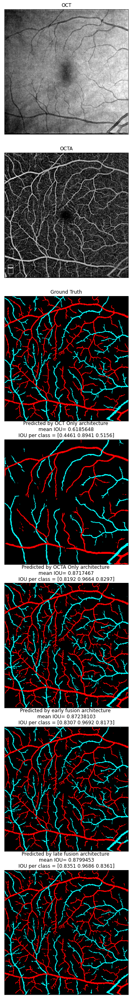

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = 'control_042.png'
# filename = 'moderate_014.png'
INPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\Input\\'
OUTPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\AV_map\\'

impred = make_predictions_4Architectures(filename, INPUT_DIR, OUTPUT_DIR)

In [ ]:
total_filenames = [filename for filename in df_total['Input']]
# INPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\Input\\'
# OUTPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\AV_map\\'
def generating_AV_map(INPUT_DIR, DESTINATION):
    # i=np.int(0)
    # SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    # files = []
    for filename in total_filenames:

        SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
        file_OCT_OCTA = INPUT_DIR + 'train\\Input\\' + filename[:-4] + '.png'
        file_AV_map = OUTPUT_DIR + filename[:-4] + '.png'
        im_OCT_OCTA = Image.open(file_OCT_OCTA)
        im_AV_map = Image.open(file_AV_map)
        im_OCT_OCTA = np.array(im_OCT_OCTA)/255.0
        im_AV_map = np.array(im_AV_map)/255.0
        MeanIOU =[]
        impred=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
        for i in range(div):
            for j in range(div):
                im_OCT_OCTA_e=im_OCT_OCTA[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
                im_OCT_OCTA_e = np.reshape(im_OCT_OCTA_e,(1, im_OCT_OCTA_e.shape[0], im_OCT_OCTA_e.shape[1], im_OCT_OCTA_e.shape[2]))
                impred[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_OCT_OCTA_e)
            
        impredinv = inv_classification_map(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))   
        AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
        # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
        iouMC1 = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
        # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
        # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
        # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
        iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
        impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
        GT_vessels = VesselsMask(im_AV_map)
        iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
                                                          np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
        # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
        
        # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
        # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
        # metric = tf.keras.metrics.MeanIoU(num_classes=2)
        # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
        # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
        # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
        # MeanIOU.append(iouMC1)

        # print(filename[:-4])
        # print('meanIOU  = ', iouMC1)
        # print('IOU coef per class = ', iou_perclass)
        # print('IOU coef for vessels = ', iou_vessels)

        if filename[0:3]=='con':
            destination_Output = DESTINATION + 'Control\\AV_map\\' + filename[:-4]+'.tiff'
            Image.fromarray(impredinv.astype(np.uint8)).save(destination_Output)
        if filename[0:3]=='mil':
            destination_Output = DESTINATION + 'NPDR_Mild\\AV_map\\' + filename[:-4]+'.tiff'
            Image.fromarray(impredinv.astype(np.uint8)).save(destination_Output)
        if filename[0:3]=='mod':
            destination_Output = DESTINATION + 'NPDR_Moderate\\AV_map\\' + filename[:-4]+'.tiff'
            Image.fromarray(impredinv.astype(np.uint8)).save(destination_Output)
        if filename[0:3]=='sev':
            destination_Output = DESTINATION + 'NPDR_Severe\\AV_map\\' + filename[:-4]+'.tiff'
            Image.fromarray(impredinv.astype(np.uint8)).save(destination_Output)



        plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
        display_list = [np.expand_dims(im_OCT_OCTA[:,:,0], axis=2), np.expand_dims(im_OCT_OCTA[:,:,1], axis=2), 255.0*GT_vessels, 255.0*impred_vessels, AV_map_inv, 
                        impredinv]
        titles=['OCT', 'OCTA', 'Ground Truth Vessels', 'Predicted Vessels (IOU= '+str(iou_vessels)+')', 'Ground Truth', 'Predicted (meanIOU= '+str(iouMC1)+')\nIOU coef per class = '+str(np.around(iou_perclass,4))]
        for i in range(len(display_list)):
            plt.subplot(1, len(display_list), i+1)
            plt.title(titles[i])
            plt.xticks([])
            plt.yticks([])
            img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
            plt.imshow(img_arr)


    return impred







        # # print(i)
        # # i+= 1
        # file_OCT = SOURCE + subfolder + '\\'+SUBCLASS[1]+'\\' + filename[:-5]+'.tiff'
        # file_OCTA = SOURCE + subfolder + '\\'+SUBCLASS[2]+'\\' + filename[:-5]+'.tiff'
        # file_AV_map = SOURCE + subfolder + '\\'+SUBCLASS[3]+'\\' + filename[:-5]+'.tiff'


        # im_OCT = Image.open(file_OCT)
        # im_OCTA = Image.open(file_OCTA)
        # im_AV_map = Image.open(file_AV_map)
        # im_OCT = im_OCT.convert('L')
        # im_OCTA = im_OCTA.convert('L')

        # im_OCT = im_OCT.resize((imagesize, imagesize))
        # im_OCTA = im_OCTA.resize((imagesize, imagesize))
        # im_AV_map = im_AV_map.resize((imagesize, imagesize))
        # im_zero = np.zeros((imagesize, imagesize))

        # im_OCT = np.array(im_OCT, dtype=np.float32)
        # im_OCTA = np.array(im_OCTA, dtype=np.float32)
        # im_AV_map = np.array(im_AV_map, dtype=np.float32)
        
        # im_OCT = 255.0*(im_OCT-np.min(im_OCT))/(np.max(im_OCT)-np.min(im_OCT))
        # im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))

        # im_OCT = np.expand_dims(im_OCT, axis=2)
        # im_OCTA = np.expand_dims(im_OCTA, axis=2)
        # im_zero = np.expand_dims(im_zero, axis=2)
        # im_OCT_OCTA = np.concatenate((im_OCT, im_OCTA, im_zero), axis=-1)
        # im_AV_OneHot=classification_map(im_AV_map)

        # destination_Input = DESTINATION + 'train\\Input'+'\\' + filename[:-5]+'.png'
        # destination_Output = DESTINATION + 'train\\AV_map'+'\\' + filename[:-5]+'.png'

        # Image.fromarray(np.squeeze(im_OCT_OCTA.astype(np.uint8))).save(destination_Input)
        # Image.fromarray(im_AV_OneHot.reshape(imagesize, imagesize,3).astype(np.uint8)).save(destination_Output)

        # p = Path(destination_Input)
        # head, tail = os.path.split(p)
        # files.append(tail)










    # print(files)
    # files=list(set(files))
    # training_length = int(len(files) * SPLIT_SIZE)
    # testing_length = int(len(files) - training_length)
    # print(len(files),training_length,testing_length )
    # shuffled_set = random.sample(files, len(files))
    # training_set = shuffled_set[0:training_length]
    # testing_set = shuffled_set[training_length:]



    # for filename in training_set:
    #     this_file = DESTINATION + 'Input'+ '\\' + filename[:-4]+'.png'
    #     destination = TRAINING + 'Input'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)


    # for filename in testing_set:
    #     this_file = DESTINATION + 'Input'+ '\\' + filename[:-4]+'.png'
    #     destination = TESTING + 'Input'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)


    # for filename in training_set:
    #     this_file = DESTINATION + 'Output'+ '\\' + filename[:-4]+'.png'
    #     destination = TRAINING + 'Output'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)


    # for filename in testing_set:
    #     this_file = DESTINATION + 'Output'+ '\\' + filename[:-4]+'.png'
    #     destination = TESTING + 'Output'+ '\\img\\' + filename[:-4]+'.png'
    #     copyfile(this_file, destination)

    # return files




INPUT_DIR = "D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\"
DESTINATION_DIR = "D:\\AV Project\\Dataset2022\\"


filenames = generating_AV_map(INPUT_DIR, DESTINATION_DIR)

ValueError: ignored

In [ ]:
imagesize = 320
subimagesize = imagesize

In [ ]:
def generating_AV_map_OCTOCTA_OCTAOnly_forNewDataset(filename, INPUT_DIR, DESTINATION):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    
    if filename[0:3]=='con' or filename[0:3]=='CON':
        # file_OCT = INPUT_DIR + 'Control\\OCT\\' + filename + '.tiff'
        # file_OCTA = INPUT_DIR + 'Control\\OCTA\\' + filename + '.tiff'
        file_OCT = INPUT_DIR + 'Control\\OCT\\' + filename + '.png'
        file_OCTA = INPUT_DIR + 'Control\\OCTA\\' + filename + '.png'
        destination_Output_OCTOCTA = DESTINATION + 'Control\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'Control\\AV_map\\' + filename+'OCTAOnly.tiff'
    if filename[0:3]=='mil':
        file_OCT = INPUT_DIR + 'NPDR_Mild\\OCT\\' + filename + '.tiff'
        file_OCTA = INPUT_DIR + 'NPDR_Mild\\OCTA\\' + filename + '.tiff'
        destination_Output_OCTOCTA = DESTINATION + 'NPDR_Mild\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'NPDR_Mild\\AV_map\\' + filename+'OCTAOnly.tiff'
    if filename[0:3]=='mod':
        file_OCT = INPUT_DIR + 'NPDR_Moderate\\OCT\\' + filename + '.tiff'
        file_OCTA = INPUT_DIR + 'NPDR_Moderate\\OCTA\\' + filename + '.tiff'
        destination_Output_OCTOCTA = DESTINATION + 'NPDR_Moderate\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'NPDR_Moderate\\AV_map\\' + filename+'OCTAOnly.tiff'
    if filename[0:3]=='sev':
        file_OCT = INPUT_DIR + 'NPDR_Severe\\OCT\\' + filename + '.tiff'
        file_OCTA = INPUT_DIR + 'NPDR_Severe\\OCTA\\' + filename + '.tiff'
        destination_Output_OCTOCTA = DESTINATION + 'NPDR_Severe\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'NPDR_Severe\\AV_map\\' + filename+'OCTAOnly.tiff'


    # file_AV_map = OUTPUT_DIR + filename + '.png'
    im_OCT = Image.open(file_OCT)
    im_OCTA = Image.open(file_OCTA)
    im_OCT = im_OCT.convert('L')
    im_OCTA = im_OCTA.convert('L')
    im_OCT = im_OCT.resize((imagesize, imagesize))
    im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCT = np.array(im_OCT, dtype=np.float32)
    im_OCTA = np.array(im_OCTA, dtype=np.float32)
    im_OCT = 255.0*(im_OCT-np.min(im_OCT))/(np.max(im_OCT)-np.min(im_OCT))
    im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    im_zero = np.zeros((imagesize, imagesize))
    im_OCT = np.expand_dims(im_OCT, axis=2)
    im_OCTA = np.expand_dims(im_OCTA, axis=2)
    im_zero = np.expand_dims(im_zero, axis=2)
    im_OCT_OCTA_zero = np.concatenate((im_OCT, im_OCTA, im_zero), axis=-1)
    im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    # im_AV_map = Image.open(file_AV_map)
    im_OCT_OCTA_zero = im_OCT_OCTA_zero/255.0
    im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    # im_AV_map = np.array(im_AV_map)/255.0


    MeanIOU =[]
    # impred_Vessels=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    impredOCTOCTA=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredOCTAOnly=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    # impred=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    
    for i in range(div):
        for j in range(div):
            im_OCT_OCTA_zero_e=im_OCT_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_OCTA_zero_e = np.reshape(im_OCT_OCTA_zero_e,(1, im_OCT_OCTA_zero_e.shape[0], im_OCT_OCTA_zero_e.shape[1], im_OCT_OCTA_zero_e.shape[2]))
            im_zero_OCTA_zero_e=im_zero_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_zero_OCTA_zero_e = np.reshape(im_zero_OCTA_zero_e,(1, im_zero_OCTA_zero_e.shape[0], im_zero_OCTA_zero_e.shape[1], im_zero_OCTA_zero_e.shape[2]))
            impredOCTOCTA[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTOCTA.predict(im_OCT_OCTA_zero_e)
            impredOCTAOnly[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTAOnly.predict(im_zero_OCTA_zero_e)

         
    impredOCTOCTAinv = inv_classification_map(np.reshape(impredOCTOCTA,(impredOCTOCTA.shape[1], impredOCTOCTA.shape[2], impredOCTOCTA.shape[3])))
    impredOCTAOnlyinv = inv_classification_map(np.reshape(impredOCTAOnly,(impredOCTAOnly.shape[1], impredOCTAOnly.shape[2], impredOCTAOnly.shape[3])))      

    Image.fromarray(impredOCTOCTAinv.astype(np.uint8)).save(destination_Output_OCTOCTA)
    Image.fromarray(impredOCTAOnlyinv.astype(np.uint8)).save(destination_Output_OCTAOnly)

    # Image.fromarray(impredOCTOCTAinv.astype(np.uint8)).save(destination_Output_OCTAOnly[:-13]+'n.tiff')
    # Image.fromarray(impredOCTAOnlyinv.astype(np.uint8)).save(destination_Output_OCTAOnly[:-13]+'n.tiff')


    print(filename)

    plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
    display_list = [np.expand_dims(im_OCT_OCTA_zero[:,:,0], axis=2), np.expand_dims(im_OCT_OCTA_zero[:,:,1], axis=2), impredOCTOCTAinv, impredOCTAOnlyinv]
    titles=['OCT', 'OCTA', 'Predicted by OCT+OCTA architecture', 'Predicted by OCTA Only architecture']
    cmaps = ['gray', 'gray', 'viridis', 'viridis']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)


    return impredOCTOCTAinv, impredOCTAOnlyinv
            

CONTROL-024


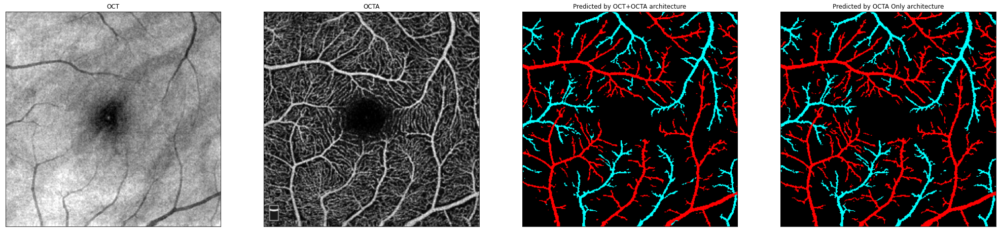

In [ ]:
filename = 'CONTROL-024'
INPUT_DIR = "D:\\AV Project\\Dataset3x3mm\\"
DESTINATION = "D:\\AV Project\\Dataset3x3mm\\"
impredOCTOCTAinv, impredOCTAOnlyinv = generating_AV_map_OCTOCTA_OCTAOnly_forNewDataset(filename, INPUT_DIR, DESTINATION)

control_077


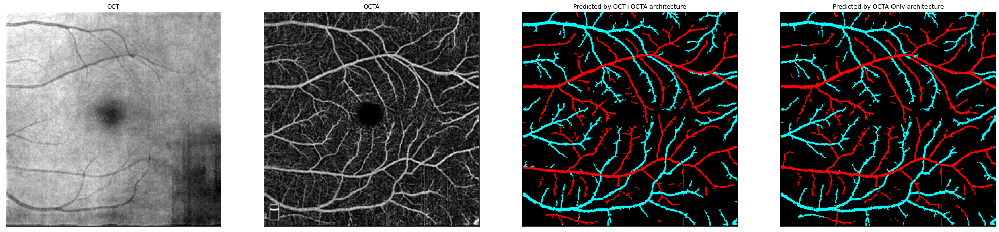

In [ ]:
filename = 'control_077'
INPUT_DIR = "D:\\AV Project\\Dataset2022\\"
DESTINATION = "D:\\AV Project\\Dataset2022\\"
impredOCTOCTAinv, impredOCTAOnlyinv = generating_AV_map_OCTOCTA_OCTAOnly_forNewDataset(filename, INPUT_DIR, DESTINATION)

Sec= 5  i= 1  j= 1 (320, 320, 1)


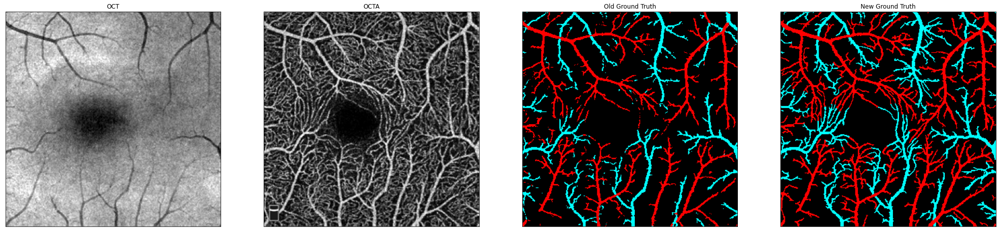

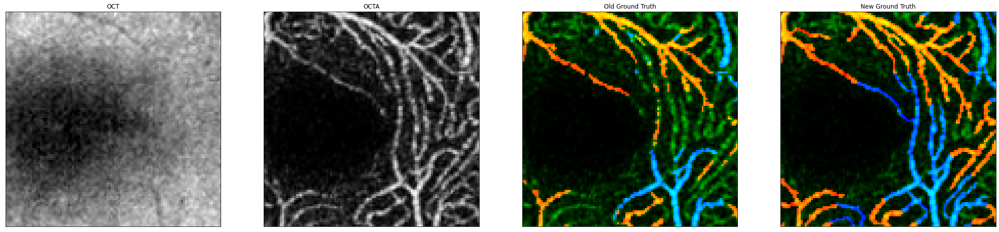

In [ ]:
filename = 'CONTROL-035'
# filename = 'control_011'

# INPUT_DIR = "D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\"
# OUTPUT_DIR = 'D:\\AV Project\\AV-Net\\tmp_Idea11\\Dataset\\train\\AV_map\\'
DESTINATION_DIR = "D:\\AV Project\\Dataset3x3mm\\"


if filename[0:3]=='CON':
    # file_OCT = DESTINATION_DIR + 'Control\\OCT\\' + filename + '.tiff'
    # file_OCTA = DESTINATION_DIR + 'Control\\OCTA\\' + filename + '.tiff'
    file_OCT = DESTINATION_DIR + 'Control\\OCT\\' + filename + '.png'
    file_OCTA = DESTINATION_DIR + 'Control\\OCTA\\' + filename + '.png'
    file_new_AV_map = DESTINATION_DIR + 'Control\\AV_map\\' + filename+'.tiff'
    file_edited_AV_map = DESTINATION_DIR + 'Control\\AV_map\\' + filename+'.tiff'
if filename[0:3]=='mil':
    file_OCT = DESTINATION_DIR + 'NPDR_Mild\\OCT\\' + filename + '.tiff'
    file_OCTA = DESTINATION_DIR + 'NPDR_Mild\\OCTA\\' + filename + '.tiff'
    file_new_AV_map = DESTINATION_DIR + 'NPDR_Mild\\AV_map\\' + filename+'.tiff'
    file_edited_AV_map = DESTINATION_DIR + 'NPDR_Mild\\AV_map\\' + filename+'.tiff'
if filename[0:3]=='mod':
    file_OCT = DESTINATION_DIR + 'NPDR_Moderate\\OCT\\' + filename + '.tiff'
    file_OCTA = DESTINATION_DIR + 'NPDR_Moderate\\OCTA\\' + filename + '.tiff'
    file_new_AV_map = DESTINATION_DIR + 'NPDR_Moderate\\AV_map\\' + filename+'.tiff'
    file_edited_AV_map = DESTINATION_DIR + 'NPDR_Moderate\\AV_map\\' + filename+'.tiff'
if filename[0:3]=='sev':
    file_OCT = DESTINATION_DIR + 'NPDR_Severe\\OCT\\' + filename + '.tiff'
    file_OCTA = DESTINATION_DIR + 'NPDR_Severe\\OCTA\\' + filename + '.tiff'
    file_new_AV_map = DESTINATION_DIR + 'NPDR_Severe\\AV_map\\' + filename+'.tiff'
    file_edited_AV_map = DESTINATION_DIR + 'NPDR_Severe\\AV_map\\' + filename+'.tiff'




SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
# file_OCT_OCTA = INPUT_DIR + 'train\\Input\\' + filename + '.png'
file_old_AV_map = DESTINATION_DIR + 'Control\\AV_map\\' + filename+'OCTOCTA.tiff'
im_OCT = Image.open(file_OCT)
im_OCTA = Image.open(file_OCTA)
im_OCT = im_OCT.convert('L')
im_OCTA = im_OCTA.convert('L')
im_OCT = im_OCT.resize((imagesize, imagesize))
im_OCTA = im_OCTA.resize((imagesize, imagesize))
im_OCT = np.array(im_OCT, dtype=np.float32)
im_OCTA = np.array(im_OCTA, dtype=np.float32)
im_OCT = 255.0*(im_OCT-np.min(im_OCT))/(np.max(im_OCT)-np.min(im_OCT))
im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
im_OCT = np.expand_dims(im_OCT, axis=2)
im_OCTA = np.expand_dims(im_OCTA, axis=2)
old_AV_map = Image.open(file_old_AV_map)
new_AV_map = Image.open(file_new_AV_map)
# im_OCT_OCTA = np.array(im_OCT_OCTA)
old_AV_map = np.array(old_AV_map)
new_AV_map = np.array(new_AV_map)


# old_AV_map_inv = inv_classification_map(np.reshape(old_AV_map,(old_AV_map.shape[0], old_AV_map.shape[1], old_AV_map.shape[2])))  
old_AV_map_inv = old_AV_map

# OCTAcut=np.where(im_OCT_OCTA[:,:,1]<0.4*255.0,0,im_OCT_OCTA[:,:,1])

old_AV_map_inv1 = np.concatenate((np.expand_dims(old_AV_map_inv[:,:,0], axis=2),1.0*im_OCTA,np.expand_dims(old_AV_map_inv[:,:,2], axis=2)), axis=-1)
new_AV_map1 = np.concatenate((1.0*np.expand_dims(new_AV_map[:,:,0], axis=2),1.0*im_OCTA,1.0*np.expand_dims(new_AV_map[:,:,2], axis=2)), axis=-1)

# old_AV_map_inv1 = np.concatenate((np.expand_dims(old_AV_map_inv[:,:,0], axis=2),0.5*np.expand_dims(im_OCT_OCTA[:,:,1], axis=2),np.expand_dims(old_AV_map_inv[:,:,2], axis=2)), axis=-1)
# new_AV_map1 = np.concatenate((np.expand_dims(new_AV_map[:,:,0], axis=2),0.5*np.expand_dims(OCTAcut, axis=2),np.expand_dims(new_AV_map[:,:,2], axis=2)), axis=-1)
# new_AV_map1 = np.concatenate((np.expand_dims(im_OCT_OCTA[:,:,2], axis=2),0.5*np.expand_dims(OCTAcut, axis=2),np.expand_dims(im_OCT_OCTA[:,:,2], axis=2)), axis=-1)

plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
display_list = [im_OCT, im_OCTA, old_AV_map_inv, new_AV_map]
titles=['OCT', 'OCTA', 'Old Ground Truth', 'New Ground Truth']
cmaps = ['gray', 'gray', 'viridis', 'viridis']
for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
    plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)
div2= 3
subimagesize2=np.int(imagesize/div2)+1

sec= 5
i=(sec-1)//div2
j=sec-(i*div2)-1
print('Sec=',sec,' i=', i, ' j=', j, im_OCT.shape)
plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
display_list = [im_OCT[subimagesize2*i:subimagesize2*(i+1),subimagesize2*j:subimagesize2*(j+1),:], im_OCTA[subimagesize2*i:subimagesize2*(i+1),subimagesize2*j:subimagesize2*(j+1),:], 
                old_AV_map_inv1[subimagesize2*i:subimagesize2*(i+1),subimagesize2*j:subimagesize2*(j+1),:], new_AV_map1[subimagesize2*i:subimagesize2*(i+1),subimagesize2*j:subimagesize2*(j+1),:]]
titles=['OCT', 'OCTA', 'Old Ground Truth', 'New Ground Truth']
cmaps = ['gray', 'gray', 'viridis', 'viridis']
for i in range(len(display_list)):
    plt.subplot(1, len(display_list), i+1)
    plt.title(titles[i])
    plt.xticks([])
    plt.yticks([])
    img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
    plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)


In [ ]:
imagesize = 320
div = 1

In [ ]:

from scipy.ndimage.filters import convolve


def Hessian2D(I, Sigma=1):
    """
    This function Hessian2 filters the image with 2nd derivatives of a
    Gaussian with parameter Sigma.
    :param I: image, in flotaing point precision (float64)
    :param Sigma: sigma of the gaussian kernel used
    :return: the 2nd derivatives
    """
    # Make kernel coordinates
    X, Y = np.meshgrid(np.arange(-np.round(3*Sigma), np.round(3*Sigma) +1),
                       np.arange(-np.round(3*Sigma), np.round(3*Sigma) +1), indexing='ij')

    # Build the gaussian 2nd derivatives filters
    DGaussxx = 1/(2*np.pi*Sigma**4)*(X**2/Sigma**2 - 1)*np.exp(-(X**2 + Y**2)/(2*Sigma**2))
    DGaussxy = (1/(2*np.pi*Sigma**6))*(X*Y)*np.exp(-(X**2 + Y**2)/(2*Sigma**2))
    DGaussyy = DGaussxx.conj().T

    Dxx = convolve(I, DGaussxx, mode='constant', cval=0.0)
    Dxy = convolve(I, DGaussxy, mode='constant', cval=0.0)
    Dyy = convolve(I, DGaussyy, mode='constant', cval=0.0)

    return Dxx, Dxy, Dyy




def eig2image(Dxx, Dxy, Dyy):
    """
    This function eig2image calculates the eigen values from the
    hessian matrix, sorted by abs value. And gives the direction
    of the ridge (eigenvector smallest eigenvalue) .
    | Dxx  Dxy |
    | Dxy  Dyy |
    """
    # Compute the eigenvectors of J, v1 and v2
    tmp = np.sqrt((Dxx - Dyy)**2 + 4*Dxy**2)
    v2x = 2*Dxy
    v2y = Dyy - Dxx + tmp

    # Normalize
    mag = np.sqrt(v2x**2 + v2y**2)
    i = np.invert(np.isclose(mag, np.zeros(mag.shape)))
    v2x[i] = v2x[i]/mag[i]
    v2y[i] = v2y[i]/mag[i]

    # The eigenvectors are orthogonal
    v1x = -v2y.copy()
    v1y = v2x.copy()

    # Compute the eigenvalues
    mu1 = 0.5*(Dxx + Dyy + tmp)
    mu2 = 0.5*(Dxx + Dyy - tmp)

    # Sort eigenvalues by absolute value abs(Lambda1)<abs(Lambda2)
    check = np.absolute(mu1) > np.absolute(mu2)

    Lambda1 = mu1.copy()
    Lambda1[check] = mu2[check]
    Lambda2 = mu2.copy()
    Lambda2[check] = mu1[check]

    Ix = v1x.copy()
    Ix[check] = v2x[check]
    Iy = v1y.copy()
    Iy[check] = v2y[check]

    return Lambda1, Lambda2, Ix, Iy


# --------------------------------------------------------


def FrangiFilter2D(I, FrangiScaleRange=np.array([1, 2]), FrangiScaleRatio=2,
                   FrangiBetaOne=0.5, FrangiBetaTwo=15, verbose=False, BlackWhite=False):
    """
    This function FRANGIFILTER2D uses the eigenvectors of the Hessian to
    compute the likeliness of an image region to vessels, according
    to the method described by Frangi:2001 (Chapter 2). Adapted from MATLAB code
    :param I: imput image (grayscale)
    :param FrangiScaleRange: The range of sigmas used, default [1 10]
    :param FrangiScaleRatio: Step size between sigmas, default 2
    :param FrangiBetaOne: Frangi correction constant, default 0.5
    :param FrangiBetaTwo: Frangi correction constant, default 15
    :param verbose: Show debug information, default false
    :param BlackWhite: Detect black ridges (default) set to true, for white ridges set to false.
    :return: The vessel enhanced image (pixel is the maximum found in all scales)
    """



   
    if len(FrangiScaleRange) > 1:
        sigmas = np.arange(FrangiScaleRange[0], FrangiScaleRange[1]+1, FrangiScaleRatio)
        sigmas = sorted(sigmas)
    else:
        sigmas = [FrangiScaleRange[0]]
    beta = 2*FrangiBetaOne**2
    c = 2*FrangiBetaTwo**2

    # Make matrices to store all filterd images
    ALLfiltered = np.zeros([I.shape[0], I.shape[1], len(sigmas)])
    ALLangles = np.zeros([I.shape[0], I.shape[1], len(sigmas)])

    # Frangi filter for all sigmas
    for i in range(len(sigmas)):
        # Show progress
        if verbose:
            print('Current Frangi Filter Sigma: ', str(sigmas[i]))

        # Make 2D hessian
        Dxx, Dxy, Dyy = Hessian2D(I, sigmas[i])

        # Correct for scale
        Dxx *= (sigmas[i]**2)
        Dxy *= (sigmas[i]**2)
        Dyy *= (sigmas[i]**2)


        # Calculate (abs sorted) eigenvalues and vectors
        Lambda2, Lambda1, Ix, Iy = eig2image(Dxx, Dxy, Dyy)

        # Compute the direction of the minor eigenvector
        angles = np.arctan2(Ix, Iy)

        # Compute some similarity measures
        near_zeros = np.isclose(Lambda1, np.zeros(Lambda1.shape))
        Lambda1[near_zeros] = 2**(-52)
        Rb = (Lambda2/Lambda1)**2
        S2 = Lambda1**2 + Lambda2**2

        # Compute the output image
        Ifiltered = np.exp(-Rb/beta)*(np.ones(I.shape)-np.exp(-S2/c))

        # see pp. 45
        if BlackWhite:
            Ifiltered[Lambda1 < 0] = 0
        else:
            Ifiltered[Lambda1 > 0] = 0

        # store the results in 3D matrices
        ALLfiltered[:, :, i] = Ifiltered.copy()
        ALLangles[:, :, i] = angles.copy()


    # Return for every pixel the value of the scale(sigma) with the maximum
    # output pixel value
    if len(sigmas) > 1:
        outIm = np.amax(ALLfiltered, axis=2)
        outIm = outIm.reshape(I.shape[0], I.shape[1], order='F')
        whatScale = np.argmax(ALLfiltered, axis=2)
        whatScale = np.reshape(whatScale, I.shape, order='F')

        indices = range(I.size) + (whatScale.flatten(order='F') - 1)*I.size
        values = np.take(ALLangles.flatten(order='F'), indices)
        direction = np.reshape(values, I.shape, order='F')
    else:
        outIm = ALLfiltered.reshape(I.shape[0], I.shape[1], order='F')
        whatScale = np.ones(I.shape)
        direction = np.reshape(ALLangles, I.shape, order='F')

    return outIm, whatScale, direction

In [ ]:
def make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    file_OCTA = INPUT_DIR + filename + '.png'
    file_AV_map = OUTPUT_DIR + filename + '.png'
    im_OCTA = Image.open(file_OCTA)
    im_OCTA = im_OCTA.convert('L')
    im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCTA = np.array(im_OCTA, dtype=np.float32)
    im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    im_zero = np.zeros((imagesize, imagesize))
    im_OCTA = np.expand_dims(im_OCTA, axis=2)
    im_zero = np.expand_dims(im_zero, axis=2)
    im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    # im_AV_map = Image.open(file_AV_map)
    im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    # im_AV_map = np.array(im_AV_map)/255.0
    print(im_OCTA.shape)
    FrFi = FrangiFilter2D(np.squeeze(im_OCTA), BlackWhite=False)
    print(len(FrFi[0]),len(FrFi[1]),len(FrFi[2]))


    MeanIOU =[]
    impred_Vessels=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    # impred=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredIO=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredVessel=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    # impred=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    
    for i in range(div):
        for j in range(div):
            im_zero_OCTA_zero_e=im_zero_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_zero_OCTA_zero_e = np.reshape(im_zero_OCTA_zero_e,(1, im_zero_OCTA_zero_e.shape[0], im_zero_OCTA_zero_e.shape[1], im_zero_OCTA_zero_e.shape[2]))
            impredIO[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTAOnly.predict(im_zero_OCTA_zero_e)
            impredVessel[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_zero_OCTA_zero_e)
         
    # impredinv = inv_classification_map(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))
    impredIOinv = inv_classification_map(np.reshape(impredIO,(impredIO.shape[1], impredIO.shape[2], impredIO.shape[3])))      
    # impred_Vessels = np.reshape(impred_Vessels,(impred_Vessels.shape[1], impred_Vessels.shape[2], impred_Vessels.shape[3]))
    # AV_map_inv = inv_classification_map(np.reshape(im_AV_map,(im_AV_map.shape[0], im_AV_map.shape[1], im_AV_map.shape[2])))     
    # iou1 = iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # iouMC1 = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_artery = (sm.metrics.IOUScore(threshold=0.5, class_weights=[1,0,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_background = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,1,0])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_vein = (sm.metrics.IOUScore(threshold=0.5, class_weights=[0,0,1])(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred)).numpy()
    # iou_perclass = iou_coef_perclass(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # impred_vessels = VesselsMask(np.reshape(impred,(impred.shape[1], impred.shape[2], impred.shape[3])))  
    # GT_vessels = VesselsMask(im_AV_map)
    # iou_vessels = (sm.metrics.IOUScore(threshold=0.5)(np.reshape(impred_vessels,(1, impred_vessels.shape[0], impred_vessels.shape[1], impred_vessels.shape[2])), 
    #                                                   np.reshape(GT_vessels,(1, GT_vessels.shape[0], GT_vessels.shape[1], GT_vessels.shape[2])))).numpy()
    # iou_vessels = iou_coef_MC(impred_vessels, GT_vessels).numpy()
    
    # iouMC1 = iou_coef_MC(np.reshape(im_AV_map,(1, im_AV_map.shape[0], im_AV_map.shape[1], 3)), impred).numpy()
    # wiou1 = w_iou_coef(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # metric = tf.keras.metrics.MeanIoU(num_classes=2)
    # meaniou = metric(np.reshape(im3e,(1, im3e.shape[0], im3e.shape[1], 1)), impred).numpy()
    # print('iou coef = ', iou1, '    iou coef_MC = ', iouMC1, '    w_iou coef = ', wiou1, '    meaniou coef = ', meaniou)
    # print('    iou coef_MC = ', iouMC1, '    meaniou coef = ', meaniou)
    # MeanIOU.append(iouMC1)

    print(filename[:-4])
    # print('meanIOU  = ', iouMC1)
    # print('IOU coef per class = ', iou_perclass)
    # print('IOU coef for vessels = ', iou_vessels)
    Thre = 0.5

    plt.figure(figsize=(40, 40)).patch.set_facecolor('white')
    display_list = [np.expand_dims(im_zero_OCTA_zero[:,:,1], axis=2), np.where(np.expand_dims(im_zero_OCTA_zero[:,:,1], axis=2)>0.3,1,0),
                    np.expand_dims(FrFi[0], axis=2), np.where(np.expand_dims(FrFi[0], axis=2)>Thre,1,0), np.expand_dims(np.squeeze(impredVessel), axis=2), impredIOinv]
    # display_list = [np.expand_dims(im_zero_OCTA_zero[:,:,1], axis=2), np.where(np.expand_dims(FrFi[0], axis=2)>0.1,1,0), impredIOinv]
    titles=['OCTA','OCTA Threshold', 'FrFi', 'FrFi Threshold = {:1}'.format(Thre), 'Predicted by Vessel Detection', 'Predicted by OCTA Only architecture trained by 6x6mm images']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr)


    return FrFi
            

(320, 320, 1)
320 320 320
CONTROL


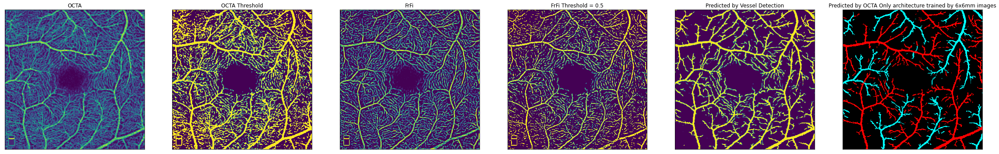

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = 'CONTROL-023'
INPUT_DIR = 'D:\\AV Project\\Dataset3x3mm\\Control\\OCTA\\'
OUTPUT_DIR = 'D:\\AV Project\\Dataset3x3mm\\Control\\OCTA\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

In [ ]:
impred[2].shape

(320, 320)

(320, 320, 1)
320 320 320
0678890 盧欽宗 ou aft


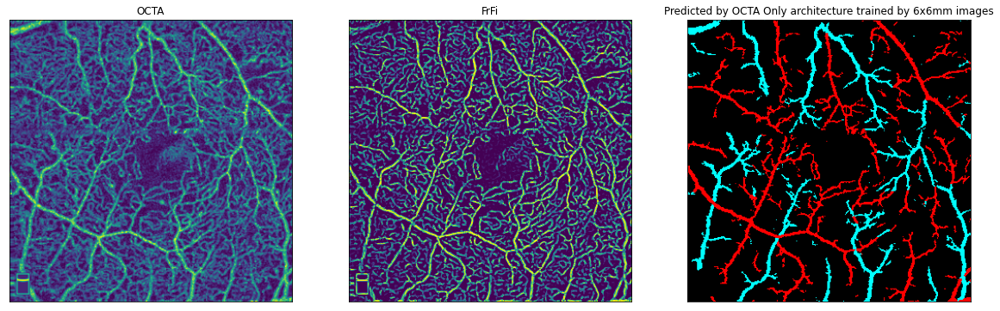

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '0678890 盧欽宗 ou after 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\0678890 盧欽宗 ou after 1\\OS\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\0678890 盧欽宗 ou after 1\\OS\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 1)
320 320 320
_4502947_4502947__15025_Angio Retina_OS_2017-07-27_10-49-10_F_1938-10-29_Enface-304x304-Superfi


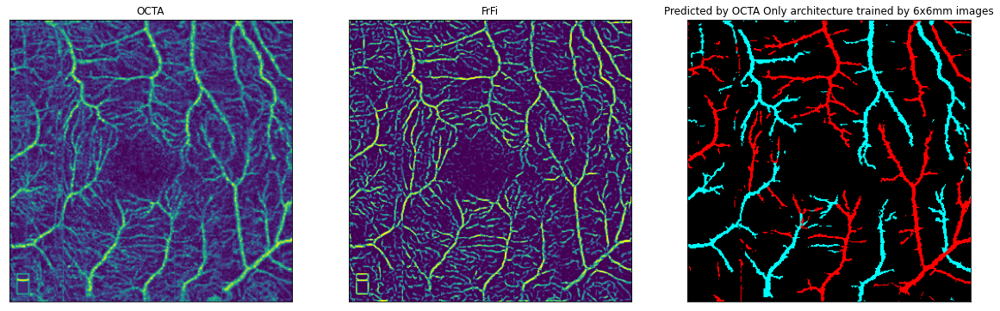

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_4502947_4502947__15025_Angio Retina_OS_2017-07-27_10-49-10_F_1938-10-29_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\01. 黃翁月華_20170727(OS)\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\01. 黃翁月華_20170727(OS)\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 1)
320 320 320
_6342852_6342852__4971_Angio Retina_OD_2016-08-24_16-50-22_F_1951-04-10_Enface-304x304-Superfi


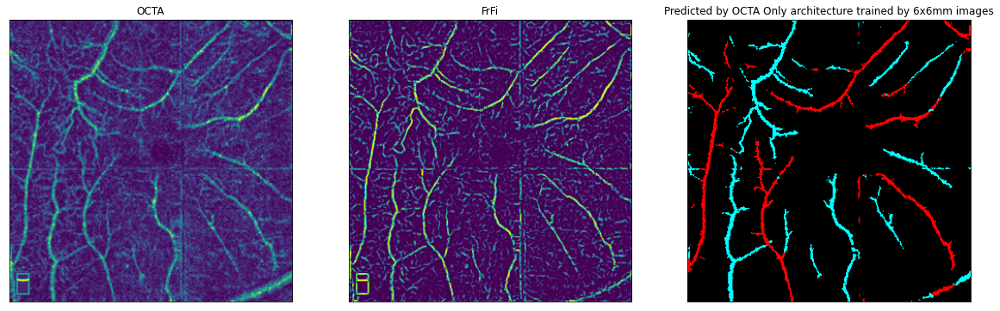

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_6342852_6342852__4971_Angio Retina_OD_2016-08-24_16-50-22_F_1951-04-10_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\04. 蘇麗玉_20160824(OD)\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\04. 蘇麗玉_20160824(OD)\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 1)
320 320 320
3729372鄧小明 ou befo


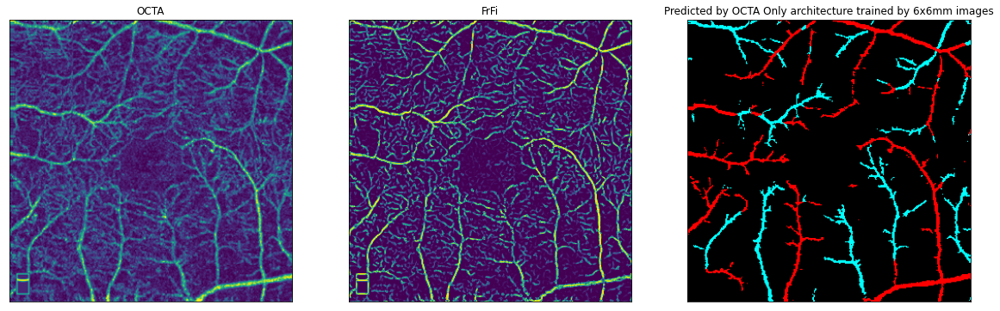

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '3729372鄧小明 ou before 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\3729372鄧小明 ou before 1\\OS\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\3729372鄧小明 ou before 1\\OS\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 1)
320 320 320
_1612563_1612563__16911_Angio Retina_OS_2017-09-18_14-41-03_F_1952-10-10_Enface-304x304-Superfi


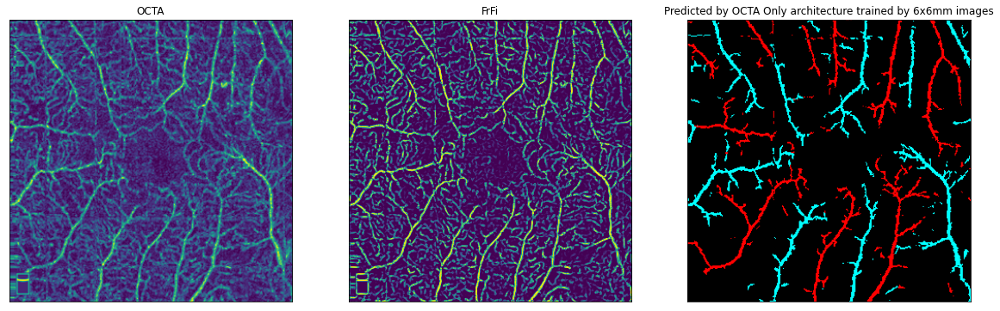

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '_1612563_1612563__16911_Angio Retina_OS_2017-09-18_14-41-03_F_1952-10-10_Enface-304x304-Superficial'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\21. 錢素貞_20170918(OS)\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA 20190203\\21. 錢素貞_20170918(OS)\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 1)
320 320 320
6159786 賴惠玲 od befo


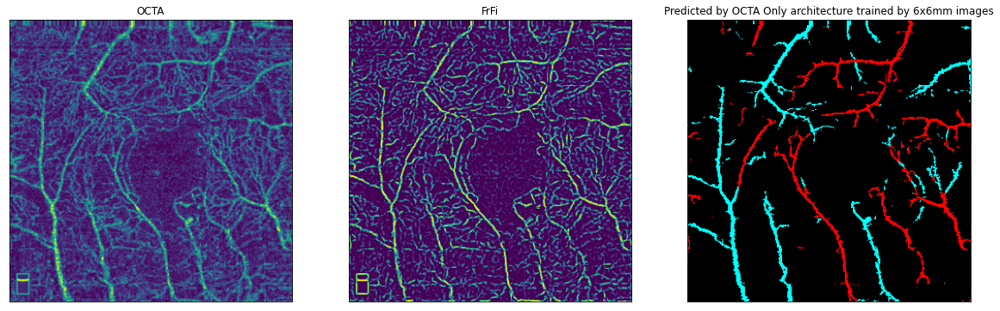

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '6159786 賴惠玲 od before 4'
INPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\6159786 賴惠玲 od before 1\\'
OUTPUT_DIR = 'D:\\AV Project\\Hsieh OCTA\\BOX_Hsieh_data\\OCTA_20170821\\6159786 賴惠玲 od before 1\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

(320, 320, 1)
320 320 320
06071995_Le_David__7687_HD Angio Retina_OD_2021-06-18_17-17-43_M_1995-06-07_Enface-400x400-Superfi


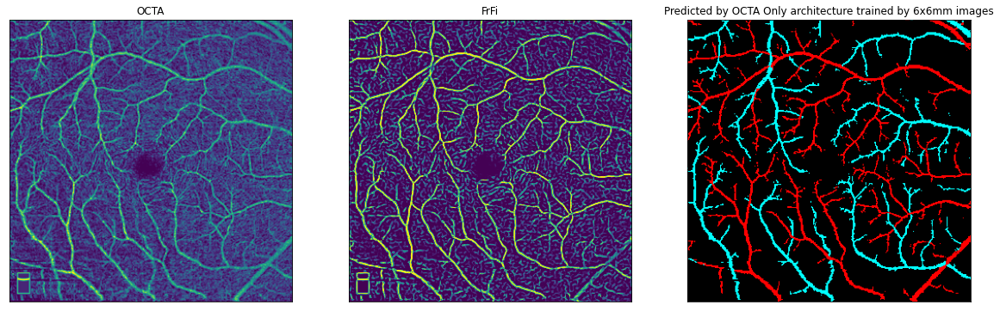

In [ ]:
# filename = (df_train.sample()).iloc[0,0]
filename = '06071995_Le_David__7687_HD Angio Retina_OD_2021-06-18_17-17-43_M_1995-06-07_Enface-400x400-Superficial'
INPUT_DIR = 'D:\\AV Project\\Lab_Members\\Lab_Members\\Le_David\\'
OUTPUT_DIR = 'D:\\AV Project\\Lab_Members\\Lab_Members\\Le_David\\'

impred = make_predictions_OCTAOnly_Hsieh_OCTA(filename, INPUT_DIR, OUTPUT_DIR)

In [ ]:
# def Combine_Vesselmap_and_AV_map(Vesselmap, AV_map):
#     image=np.zeros(AV_map.shape)
#     for i in range(image.shape[0]):
#         for j in range(image.shape[1]):
#             if (Vesselmap[i,j,0]>0.5 or AV_map[i,j,0]>127 or AV_map[i,j,1]>127):
#                 # print(AV_map[i,j,0])
#                 if (AV_map[i,j,0]>127 or AV_map[i,j,1]>127 ):
#                     image[i,j,:]=AV_map[i,j,:]
#                 else:
#                     if (np.mean(AV_map[np.where(i-20>0,i-20,0):np.where(i+20<320,i+20,320),np.where(j-20>0,j-20,0):np.where(j+20<320,j+20,320),0])
#                     >=np.mean(AV_map[np.where(i-20>0,i-20,0):np.where(i+20<320,i+20,320),np.where(j-20>0,j-20,0):np.where(j+20<320,j+20,320),1])):
#                         image[i,j,:]=[255,0,0]
#                     else:
#                         image[i,j,:]=[0,255,255]
#             else:
#                 image[i,j,:]=[0,0,0]

#     return image

In [ ]:
def NearestAV(AV_map, i, j):
    for k in range(100):
        if (np.mean(AV_map[np.where(i-k>0,i-k,0):np.where(i+k<320,i+k,320),np.where(j-k>0,j-k,0):np.where(j+k<320,j+k,320),0])
                    >np.mean(AV_map[np.where(i-k>0,i-k,0):np.where(i+k<320,i+k,320),np.where(j-k>0,j-k,0):np.where(j+k<320,j+k,320),1])):
            AV=[255,0,0]
            break;
        if (np.mean(AV_map[np.where(i-k>0,i-k,0):np.where(i+k<320,i+k,320),np.where(j-k>0,j-k,0):np.where(j+k<320,j+k,320),0])
                    <np.mean(AV_map[np.where(i-k>0,i-k,0):np.where(i+k<320,i+k,320),np.where(j-k>0,j-k,0):np.where(j+k<320,j+k,320),1])):
            AV=[0,255,255]
            break;

    return AV

In [ ]:
def Combine_Vesselmap_and_AV_map(Vesselmap, AV_map):
    image=np.zeros(AV_map.shape)
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            if (Vesselmap[i,j,0]>0.5 or AV_map[i,j,0]>127 or AV_map[i,j,1]>127):
                # print(AV_map[i,j,0])
                if (AV_map[i,j,0]>127 or AV_map[i,j,1]>127 ):
                    image[i,j,:]=AV_map[i,j,:]
                else:
                    image[i,j,:]=NearestAV(AV_map, i, j)
            else:
                image[i,j,:]=[0,0,0]

    return image

In [ ]:
def generating_AV_map_OCTAOnly_for3x3Dataset(filename, INPUT_DIR, DESTINATION):
    SUBCLASS=['OCT_Volume','OCT','OCTA','AV_map']
    
    
    if filename[0:3]=='con' or filename[0:3]=='CON':
        # file_OCT = INPUT_DIR + 'Control\\OCT\\' + filename + '.tiff'
        # file_OCTA = INPUT_DIR + 'Control\\OCTA\\' + filename + '.tiff'
        file_OCT = INPUT_DIR + 'Control\\OCT\\' + filename + '.png'
        file_OCTA = INPUT_DIR + 'Control\\OCTA\\' + filename + '.png'
        destination_Output_OCTOCTA = DESTINATION + 'Control\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'Control\\AV_map\\' + filename+'OCTAOnly.tiff'
        destination_Output_Combine = DESTINATION + 'Control\\AV_map\\' + filename+'Combine.tiff'
    if filename[0:3]=='mil':
        file_OCT = INPUT_DIR + 'NPDR_Mild\\OCT\\' + filename + '.tiff'
        file_OCTA = INPUT_DIR + 'NPDR_Mild\\OCTA\\' + filename + '.tiff'
        destination_Output_OCTOCTA = DESTINATION + 'NPDR_Mild\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'NPDR_Mild\\AV_map\\' + filename+'OCTAOnly.tiff'
    if filename[0:3]=='mod':
        file_OCT = INPUT_DIR + 'NPDR_Moderate\\OCT\\' + filename + '.tiff'
        file_OCTA = INPUT_DIR + 'NPDR_Moderate\\OCTA\\' + filename + '.tiff'
        destination_Output_OCTOCTA = DESTINATION + 'NPDR_Moderate\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'NPDR_Moderate\\AV_map\\' + filename+'OCTAOnly.tiff'
    if filename[0:3]=='sev':
        file_OCT = INPUT_DIR + 'NPDR_Severe\\OCT\\' + filename + '.tiff'
        file_OCTA = INPUT_DIR + 'NPDR_Severe\\OCTA\\' + filename + '.tiff'
        destination_Output_OCTOCTA = DESTINATION + 'NPDR_Severe\\AV_map\\' + filename+'OCTOCTA.tiff'
        destination_Output_OCTAOnly = DESTINATION + 'NPDR_Severe\\AV_map\\' + filename+'OCTAOnly.tiff'


    # file_AV_map = OUTPUT_DIR + filename + '.png'
    im_OCT = Image.open(file_OCT)
    im_OCTA = Image.open(file_OCTA)
    im_OCT = im_OCT.convert('L')
    im_OCTA = im_OCTA.convert('L')
    im_OCT = im_OCT.resize((imagesize, imagesize))
    im_OCTA = im_OCTA.resize((imagesize, imagesize))
    im_OCT = np.array(im_OCT, dtype=np.float32)
    im_OCTA = np.array(im_OCTA, dtype=np.float32)
    im_OCT = 255.0*(im_OCT-np.min(im_OCT))/(np.max(im_OCT)-np.min(im_OCT))
    im_OCTA = 255.0*(im_OCTA-np.min(im_OCTA))/(np.max(im_OCTA)-np.min(im_OCTA))
    im_zero = np.zeros((imagesize, imagesize))
    im_OCT = np.expand_dims(im_OCT, axis=2)
    im_OCTA = np.expand_dims(im_OCTA, axis=2)
    im_zero = np.expand_dims(im_zero, axis=2)
    im_OCT_OCTA_zero = np.concatenate((im_OCT, im_OCTA, im_zero), axis=-1)
    im_zero_OCTA_zero = np.concatenate((im_zero, im_OCTA, im_zero), axis=-1)
    # im_AV_map = Image.open(file_AV_map)
    im_OCT_OCTA_zero = im_OCT_OCTA_zero/255.0
    im_zero_OCTA_zero = im_zero_OCTA_zero/255.0
    # print(im_OCTA)
    # im_AV_map = np.array(im_AV_map)/255.0


    MeanIOU =[]
    # impred_Vessels=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    impredOCTOCTA=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredOCTAOnly=np.empty((1, imagesize, imagesize,3), dtype=np.float32)
    impredVessel=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    # impred=np.empty((1, imagesize, imagesize,1), dtype=np.float32)
    
    for i in range(div):
        for j in range(div):
            im_OCT_OCTA_zero_e=im_OCT_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_OCT_OCTA_zero_e = np.reshape(im_OCT_OCTA_zero_e,(1, im_OCT_OCTA_zero_e.shape[0], im_OCT_OCTA_zero_e.shape[1], im_OCT_OCTA_zero_e.shape[2]))
            im_zero_OCTA_zero_e=im_zero_OCTA_zero[subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:]
            im_zero_OCTA_zero_e = np.reshape(im_zero_OCTA_zero_e,(1, im_zero_OCTA_zero_e.shape[0], im_zero_OCTA_zero_e.shape[1], im_zero_OCTA_zero_e.shape[2]))
            impredOCTOCTA[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTOCTA.predict(im_OCT_OCTA_zero_e)
            impredOCTAOnly[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = modelOCTAOnly.predict(im_zero_OCTA_zero_e)
            impredVessel[:, subimagesize*i:subimagesize*(i+1),subimagesize*j:subimagesize*(j+1),:] = model.predict(im_zero_OCTA_zero_e)


    impredOCTOCTAinv = inv_classification_map(np.reshape(impredOCTOCTA,(impredOCTOCTA.shape[1], impredOCTOCTA.shape[2], impredOCTOCTA.shape[3])))
    impredOCTAOnlyinv = inv_classification_map(np.reshape(impredOCTAOnly,(impredOCTAOnly.shape[1], impredOCTAOnly.shape[2], impredOCTAOnly.shape[3])))      
    impredCombine = Combine_Vesselmap_and_AV_map(np.reshape(impredVessel,(impredVessel.shape[1], impredVessel.shape[2], impredVessel.shape[3])),
                                 impredOCTAOnlyinv)
    # print(impredVessel[0,100:110,0:10,:])
    # print(impredVessel.shape, impredOCTAOnlyinv.shape, impredCombine.shape)
    Image.fromarray(impredOCTOCTAinv.astype(np.uint8)).save(destination_Output_OCTOCTA)
    Image.fromarray(impredOCTAOnlyinv.astype(np.uint8)).save(destination_Output_OCTAOnly)
    Image.fromarray(impredCombine.astype(np.uint8)).save(destination_Output_Combine)

    # Image.fromarray(impredOCTOCTAinv.astype(np.uint8)).save(destination_Output_OCTAOnly[:-13]+'n.tiff')
    # Image.fromarray(impredOCTAOnlyinv.astype(np.uint8)).save(destination_Output_OCTAOnly[:-13]+'n.tiff')


    print(filename)

    plt.figure(figsize=(35, 35)).patch.set_facecolor('white')
    display_list = [np.expand_dims(im_OCT_OCTA_zero[:,:,0], axis=2), np.expand_dims(im_OCT_OCTA_zero[:,:,1], axis=2), impredOCTOCTAinv, impredOCTAOnlyinv, impredCombine, np.expand_dims(np.squeeze(impredVessel), axis=2)]
    titles=['OCT', 'OCTA', 'Predicted by OCT+OCTA architecture', 'Predicted by OCTA Only architecture', 'impredCombine', 'impred Vessel']
    cmaps = ['gray', 'gray', 'viridis', 'viridis', 'viridis', 'gray']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.xticks([])
        plt.yticks([])
        img_arr = tf.keras.preprocessing.image.array_to_img(display_list[i])
        plt.imshow(img_arr, cmap=cmaps[i], vmin=0, vmax=255)


    return impredOCTOCTAinv, impredOCTAOnlyinv
            

c:\users\lieri\appdata\local\programs\python\python39\lib\site-packages\numpy\core\fromnumeric.py:3372: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\users\lieri\appdata\local\programs\python\python39\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


CONTROL-053


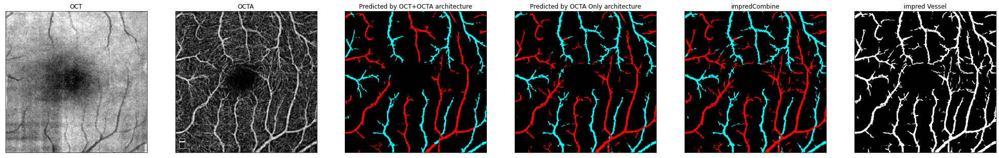

In [ ]:
filename = 'CONTROL-053'
INPUT_DIR = "D:\\AV Project\\Dataset3x3mm\\"
DESTINATION = "D:\\AV Project\\Dataset3x3mm\\"
impredOCTOCTAinv, impredOCTAOnlyinv = generating_AV_map_OCTAOnly_for3x3Dataset(filename, INPUT_DIR, DESTINATION)